Attribute Information:

1. Area (A): The area of a bean zone and the number of pixels within its boundaries.
2. Perimeter (P): Bean circumference is defined as the length of its border.
3. Major axis length (L): The distance between the ends of the longest line that can be drawn from a bean.
4. Minor axis length (l): The longest line that can be drawn from the bean while standing perpendicular to the main axis.
5. Aspect ratio (K): Defines the relationship between L and l.
6. Eccentricity (Ec): Eccentricity of the ellipse having the same moments as the region.
7. Convex area (C): Number of pixels in the smallest convex polygon that can contain the area of a bean seed.
8. Equivalent diameter (Ed): The diameter of a circle having the same area as a bean seed area.
9. Extent (Ex): The ratio of the pixels in the bounding box to the bean area.
10. Solidity (S): Also known as convexity. The ratio of the pixels in the convex shell to those found in beans.
11. Roundness (R): Calculated with the following formula: (4piA)/(P^2)
12. Compactness (CO): Measures the roundness of an object: Ed/L
13. ShapeFactor1 (SF1)
14. ShapeFactor2 (SF2)
15. ShapeFactor3 (SF3)
16. ShapeFactor4 (SF4)
17. Class (Seker, Barbunya, Bombay, Cali, Dermosan, Horoz and Sira)

ABSTRACT

Performing data cleaning on a dataset.

Using AutoML's H2O library and performing regularization, hyperparameter tuning and predicting best model for the dataset

Interpreting the models:

Fitting a linear model and interpreting the regression coefficients

Fitting a tree-based model and interpreting the nodes

Using auto ml to find the best model

Run SHAP analysis on the models, interpreting the SHAP values

In [1]:
!pip install requests
!pip install tabulate
!pip install future

!pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o

#installing dependencies
!pip install shap


## reference : https://docs.h2o.ai/h2o/latest-stable/h2o-docs/downloading.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.6/177.6 MB 6.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for h2o: filename=h2o-3.40.0.3-py2.py3-none-any.whl size=177694727 sha256=5fd6d0ee7310f2554c03218478b0f15bc84fc6fab48a8cec8a8e1b1d35bf2e01
  Stored in directory: /root/.cache/pip/wheels/9a/54/b6/c9ab3e71309ef0000bbe39e715020dc151bbfc557784b7f4c9
Successfully built h2o
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━

In [2]:
#imports

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
from matplotlib import pyplot
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.ensemble import RandomForestClassifier
import shap
import warnings
warnings.filterwarnings('ignore')

#importing H2O
import h2o

In [3]:
#Reading the drybeans dataset
data = pd.read_csv("https://raw.githubusercontent.com/r-telang/Data_Science_Assignment/main/Dry_Bean.csv")

In [4]:
data.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [5]:
# Getting the numeric and categorical data column
numco = data._get_numeric_data().columns
print(numco)

catco = data.select_dtypes(include=['object']).columns.tolist()
print(catco)

Index(['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4'],
      dtype='object')
['Class']


In [6]:
#checking if the any data is missing
data.isnull().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

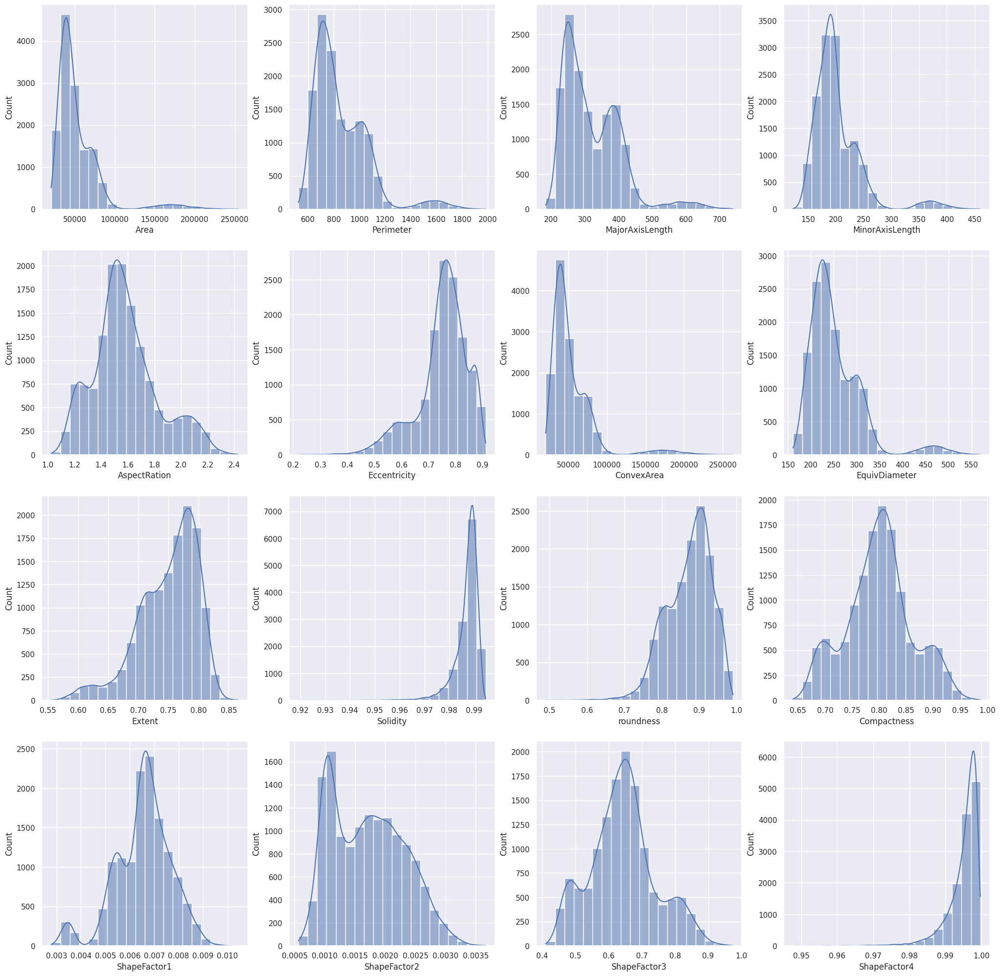

In [7]:
cols = data.columns

sns.set(rc={"figure.figsize": (25, 25)})

for i in range(len(cols)-1):
  plt.subplot(4,4,i+1)
  ax = sns.histplot(x = data[cols[i]],kde=True,bins=20)

In [8]:
# Encoding categorical data 
classes = list(np.unique(data["Class"]))
tokens = []
i = 0
for c in classes:
  tokens.append(i)
  i += 1

# Replacing classes with their tokens
data['Class'].replace(classes, tokens, inplace=True)

# Class labels and their respective label encodes
print(classes, '\n',tokens)

['BARBUNYA', 'BOMBAY', 'CALI', 'DERMASON', 'HOROZ', 'SEKER', 'SIRA'] 
 [0, 1, 2, 3, 4, 5, 6]


In [9]:
# Normalizing the data in the columns beacuse the value is too high when compared to other independent variable

from sklearn import preprocessing

print(data.columns)

x = data.drop(columns = ['Class'])

# Preparing for normalizing
min_max_scaler = preprocessing.MinMaxScaler()

# Transform the data to fit minmax processor
x_scaled = min_max_scaler.fit_transform(x)

print(x_scaled)

target = data['Class']
data_norm = pd.DataFrame(data = x_scaled, columns=data.drop(columns=['Class']).columns)
data_norm['Class']=target

Index(['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4', 'Class'],
      dtype='object')
[[0.03405267 0.05857388 0.04426214 ... 0.83304873 0.75099637 0.98061988]
 [0.03550018 0.07755673 0.03047881 ... 0.96731556 0.88498696 0.97497943]
 [0.03825855 0.06803484 0.05263303 ... 0.80094221 0.7361995  0.98719586]
 ...
 [0.09273856 0.16060492 0.17638393 ... 0.42701907 0.4722397  0.9430251 ]
 [0.09277272 0.16365701 0.17970258 ... 0.41532984 0.45691893 0.91334232]
 [0.09282396 0.16944765 0.20088207 ... 0.34689176 0.36476185 0.9701623 ]]


In [10]:
#data correlation

data.corr()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
Area,1.000000,0.966722,0.931834,0.951602,0.241735,0.267481,0.999939,0.984968,0.054345,-0.196585,-0.357530,-0.268067,-0.847958,-0.639291,-0.272145,-0.355721,-0.475252
Perimeter,0.966722,1.000000,0.977338,0.913179,0.385276,0.391066,0.967689,0.991380,-0.021160,-0.303970,-0.547647,-0.406857,-0.864623,-0.767592,-0.408435,-0.429310,-0.507638
MajorAxisLength,0.931834,0.977338,1.000000,0.826052,0.550335,0.541972,0.932607,0.961733,-0.078062,-0.284302,-0.596358,-0.568377,-0.773609,-0.859238,-0.568185,-0.482527,-0.455175
MinorAxisLength,0.951602,0.913179,0.826052,1.000000,-0.009161,0.019574,0.951339,0.948539,0.145957,-0.155831,-0.210344,-0.015066,-0.947204,-0.471347,-0.019326,-0.263749,-0.458492
AspectRation,0.241735,0.385276,0.550335,-0.009161,1.000000,0.924293,0.243301,0.303647,-0.370184,-0.267754,-0.766979,-0.987687,0.024593,-0.837841,-0.978592,-0.449264,-0.116332
Eccentricity,0.267481,0.391066,0.541972,0.019574,0.924293,1.000000,0.269255,0.318667,-0.319362,-0.297592,-0.722272,-0.970313,0.019920,-0.860141,-0.981058,-0.449354,-0.200356
ConvexArea,0.999939,0.967689,0.932607,0.951339,0.243301,0.269255,1.000000,0.985226,0.052564,-0.206191,-0.362083,-0.269922,-0.847950,-0.640862,-0.274024,-0.362049,-0.477459
EquivDiameter,0.984968,0.991380,0.961733,0.948539,0.303647,0.318667,0.985226,1.000000,0.028383,-0.231648,-0.435945,-0.327650,-0.892741,-0.713069,-0.330389,-0.392512,-0.481099
Extent,0.054345,-0.021160,-0.078062,0.145957,-0.370184,-0.319362,0.052564,0.028383,1.000000,0.191389,0.344411,0.354212,-0.141616,0.237956,0.347624,0.148502,-0.031184
Solidity,-0.196585,-0.303970,-0.284302,-0.155831,-0.267754,-0.297592,-0.206191,-0.231648,0.191389,1.000000,0.607150,0.303766,0.153388,0.343559,0.307662,0.702163,0.321283


<Axes: >

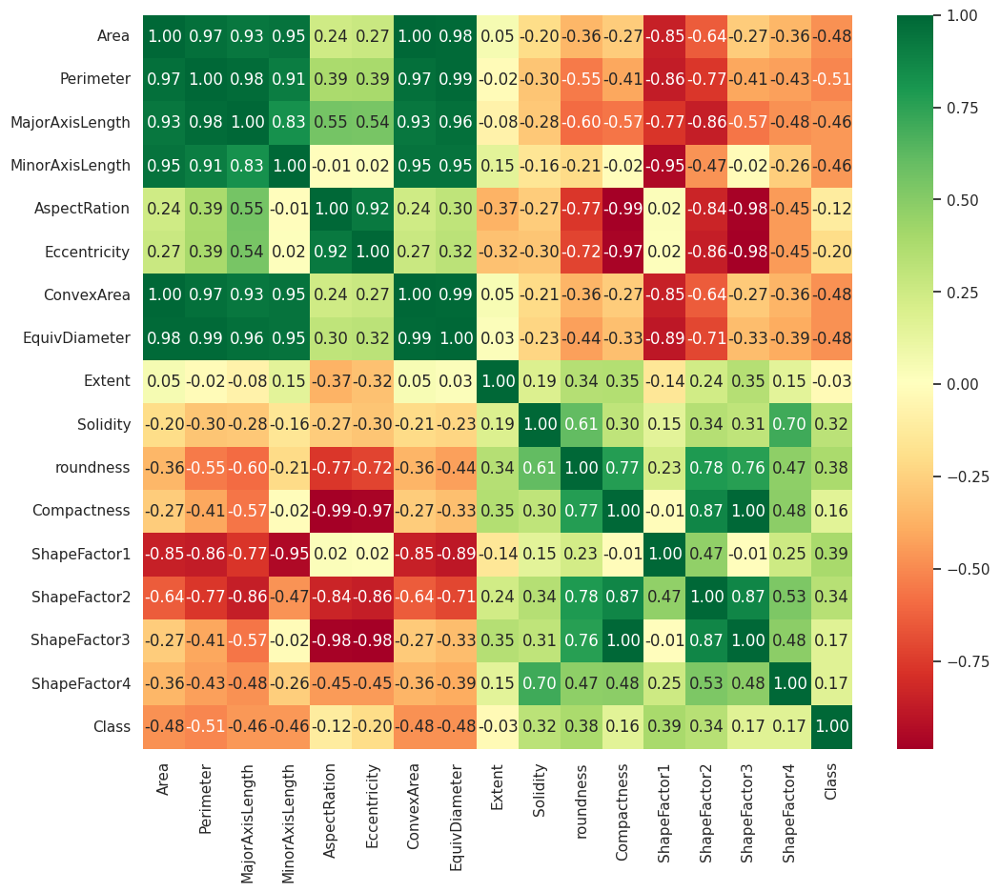

In [11]:
# heatmap of the same correlation matrix for better understanding.
plt.figure(figsize=(12,10))
sns.heatmap(data.corr(), annot=True, cmap="RdYlGn", fmt= '.2f')

In [12]:
##Random Forest Classifier

from sklearn.model_selection import train_test_split
X = data_norm.drop(columns = ['Class'])
y = data_norm['Class']
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42)

In [13]:
from sklearn.ensemble import RandomForestClassifier

feature_names = [f"feature {i}" for i in range(X.shape[1])]
forest = RandomForestClassifier(random_state=0)
forest.fit(X_train, y_train)

RandomForestClassifier(random_state=0)

Text(0.5, 0, 'Feature Importance')

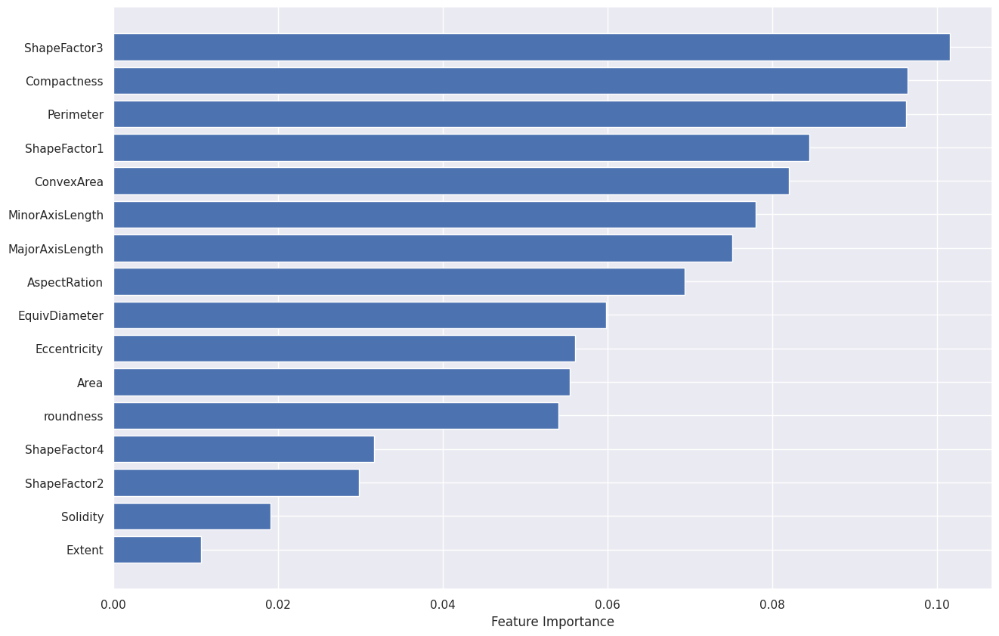

In [14]:
#Random Forest Classifier Feature Importance
plt.figure(figsize=(15,10))
sort = forest.feature_importances_.argsort()
plt.barh(data_norm.columns[sort], forest.feature_importances_[sort])
plt.xlabel("Feature Importance")

In [15]:
# Taking 20 samples out for SHAP linear analysis as it is a computationally expensive process

X_train_shap_sample = shap.utils.sample(
    X_train, 150
)  
x_test_shap_sample = shap.utils.sample(
    X_test, 150
)  

In [16]:
#Shap Values Feature Importance

%%time
%time
explainer = shap.TreeExplainer(forest)
%time
shap_values = explainer.shap_values(X_train)

CPU times: user 3 µs, sys: 1 µs, total: 4 µs
Wall time: 5.72 µs
CPU times: user 7 µs, sys: 1 µs, total: 8 µs
Wall time: 11.7 µs
CPU times: user 5min 12s, sys: 1.24 s, total: 5min 13s
Wall time: 5min 18s


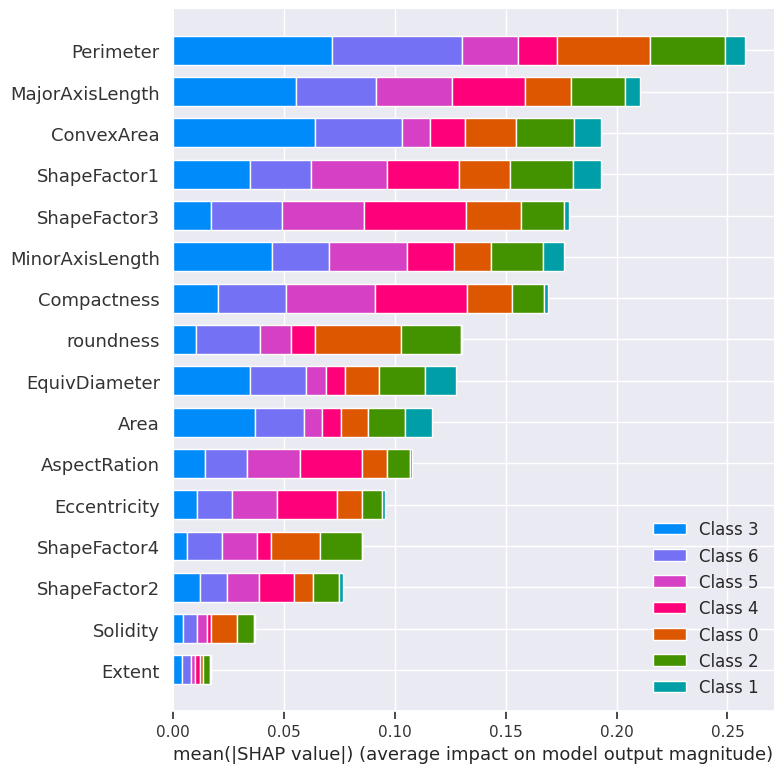

In [17]:
shap.summary_plot(shap_values, features=X_train, feature_names=X.columns, plot_type='bar')

In [18]:
#Missing Values


new_df = data_norm[['Perimeter','Solidity', 'roundness', 'ShapeFactor1','ShapeFactor2','ShapeFactor3','Class']]
new_df = new_df.drop_duplicates()

X = new_df.drop(columns = ['Class'])
y = new_df['Class']
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42)


train_df = pd.DataFrame(data = X_train,columns = X_train.columns)
train_df['Class'] = y_train



test_df = pd.DataFrame(data = X_test,columns = X_test.columns)
test_df['Class'] = y_test
# print(y_test)
#  ['Perimeter', 'Solidity', 'roundness', 'ShapeFactor1', 'ShapeFactor2', 'ShapeFactor3']
print(new_df.columns[:-1].values)
check_df = pd.merge(
    train_df,
    test_df,
    on=['Perimeter', 'Solidity', 'roundness', 'ShapeFactor1', 'ShapeFactor2', 'ShapeFactor3'], 
    how="left",
    indicator="Exist",
)

# print(check_df.describe())
# check_df.drop(["Class_x",'Class_y'], inplace=True, axis=1)
check_df["Exist"] = np.where(check_df.Exist == "both", True, False)
print(check_df["Exist"].value_counts())  # This code prints the number of unique data rows in training colomns

['Perimeter' 'Solidity' 'roundness' 'ShapeFactor1' 'ShapeFactor2'
 'ShapeFactor3']
False    10157
Name: Exist, dtype: int64


#### Data Removal


In [19]:
# 1% data Removal


p = 0.01
mask = np.random.choice([True, False], size=new_df.shape, p=[p,1-p])
nan_1p_df = new_df.mask(mask)

nan_1p_df.info()
#We can see 1% data is made null as non null values are not same as total entries

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13543 entries, 0 to 13610
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Perimeter     13385 non-null  float64
 1   Solidity      13404 non-null  float64
 2   roundness     13392 non-null  float64
 3   ShapeFactor1  13401 non-null  float64
 4   ShapeFactor2  13425 non-null  float64
 5   ShapeFactor3  13389 non-null  float64
 6   Class         13426 non-null  float64
dtypes: float64(7)
memory usage: 846.4 KB


In [20]:
#5% data Removal
p = 0.05
mask = np.random.choice([True, False], size=new_df.shape, p=[p,1-p])
nan_5p_df = new_df.mask(mask)
nan_5p_df.info()
#We can see 5% data is made null as non null values are not same as total entries

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13543 entries, 0 to 13610
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Perimeter     12869 non-null  float64
 1   Solidity      12840 non-null  float64
 2   roundness     12856 non-null  float64
 3   ShapeFactor1  12889 non-null  float64
 4   ShapeFactor2  12835 non-null  float64
 5   ShapeFactor3  12900 non-null  float64
 6   Class         12858 non-null  float64
dtypes: float64(7)
memory usage: 846.4 KB


In [21]:
# 10% data Removal

p = 0.1
mask = np.random.choice([True, False], size=new_df.shape, p=[p,1-p])
nan_10p_df = new_df.mask(mask)
print(nan_10p_df.info())
#We can see 10% data is made null as non null values are not same as total entries

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13543 entries, 0 to 13610
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Perimeter     12166 non-null  float64
 1   Solidity      12157 non-null  float64
 2   roundness     12241 non-null  float64
 3   ShapeFactor1  12147 non-null  float64
 4   ShapeFactor2  12125 non-null  float64
 5   ShapeFactor3  12205 non-null  float64
 6   Class         12137 non-null  float64
dtypes: float64(7)
memory usage: 846.4 KB
None


###  Data Imputation

1. With Mean values

In [22]:
nan_10p_df_mean = nan_10p_df.fillna(nan_10p_df.mean())
nan_1p_df_mean = nan_1p_df.fillna(nan_1p_df.mean())
nan_5p_df_mean = nan_5p_df.fillna(nan_5p_df.mean())

2. Dropping these Nan values

In [23]:
nan_10p_df_drop = nan_10p_df.dropna()
print('nan_10p_df_drop shape:',nan_10p_df_drop.shape)
nan_1p_df_drop = nan_1p_df.dropna()
print('nan_1p_df_drop shape:',nan_1p_df_drop.shape)
nan_5p_df_drop = nan_5p_df.dropna()
print('nan_5p_df_drop shape:',nan_5p_df_drop.shape)

nan_10p_df_drop shape: (6461, 7)
nan_1p_df_drop shape: (12595, 7)
nan_5p_df_drop shape: (9444, 7)


3. Fill with KNN

In [24]:
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=5, weights='uniform', metric='nan_euclidean')
# fit on the dataset

def impute_knn(impute_df,imputer):

  X = impute_df
  imputer.fit(X)
  Xtrans = imputer.transform(X)

  res_df = pd.DataFrame(data=Xtrans, columns = impute_df.columns[:])

  return res_df

nan_1p_df_knn = impute_knn(nan_1p_df, imputer)
nan_5p_df_knn = impute_knn(nan_5p_df, imputer)
nan_10p_df_knn = impute_knn(nan_10p_df, imputer)

Reference: https://machinelearningmastery.com/knn-imputation-for-missing-values-in-machine-learning/

###Check how well imputer mean

In [25]:
len(cols)


17

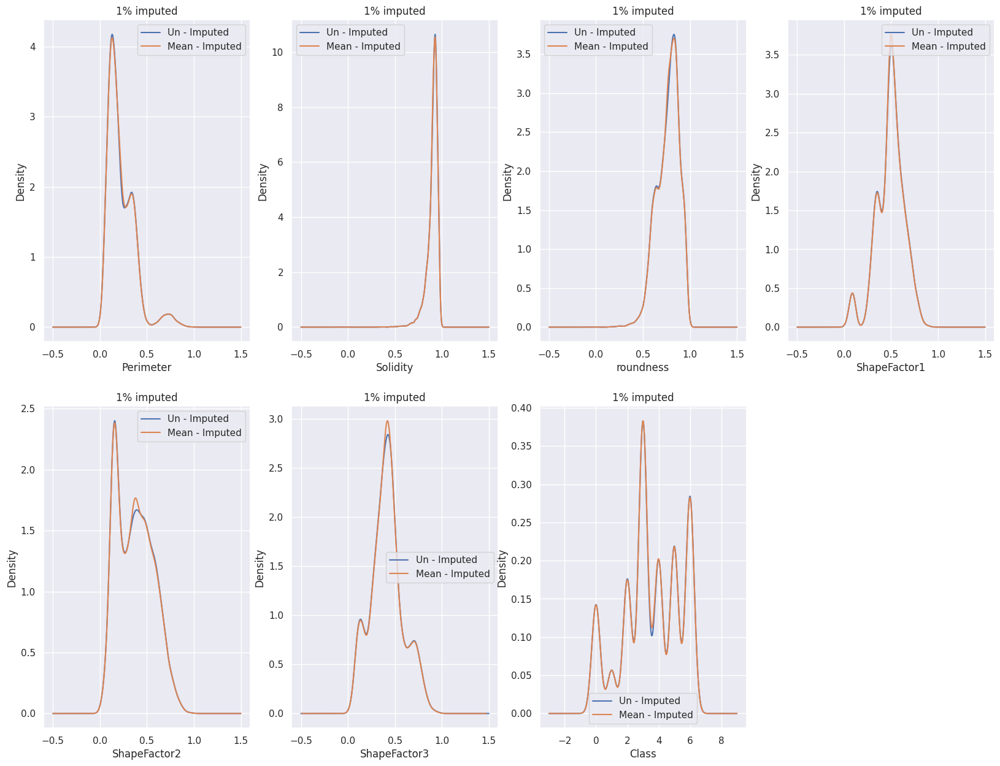

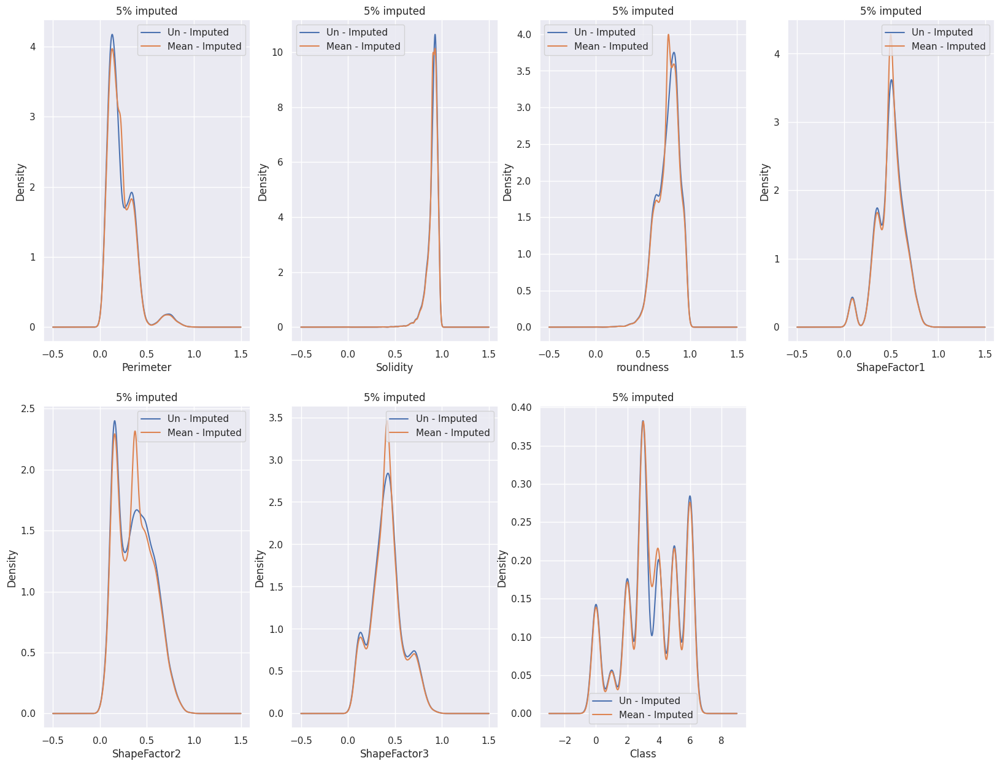

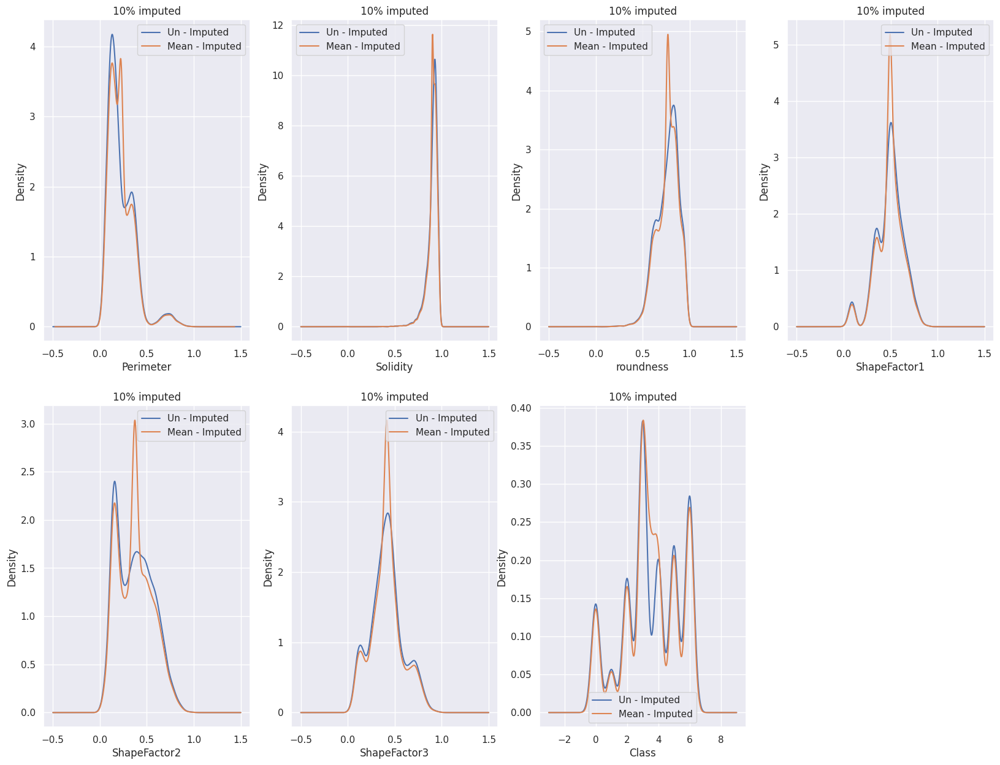

In [26]:
cols = new_df.columns
# len(cols)
#1% data

plt.figure(figsize=(20,15))

i = 0
for col in cols[:]:
  plt.subplot(2,4,i+1)
  i+=1
  new_df[col].plot(kind="kde")
  nan_1p_df_mean[col].plot(kind="kde")
  plt.title('1% imputed')
  plt.legend(["Un - Imputed", "Mean - Imputed"])
  plt.xlabel(f"{col}")
  


#5% data
plt.figure(figsize=(20,15))

i = 0
for col in cols[:]:
  plt.subplot(2,4,i+1)
  i+=1
  new_df[col].plot(kind="kde")
  nan_5p_df_mean[col].plot(kind="kde")
  plt.title('5% imputed')
  plt.legend(["Un - Imputed", "Mean - Imputed"])
  plt.xlabel(f"{col}")
  

#10% data
plt.figure(figsize=(20,15))

i = 0
for col in cols[:]:
  plt.subplot(2,4,i+1)
  i+=1
  new_df[col].plot(kind="kde")
  nan_10p_df_mean[col].plot(kind="kde")
  plt.title('10% imputed')
  plt.legend(["Un - Imputed", "Mean - Imputed"])
  plt.xlabel(f"{col}")

#### Check how well imputer drop

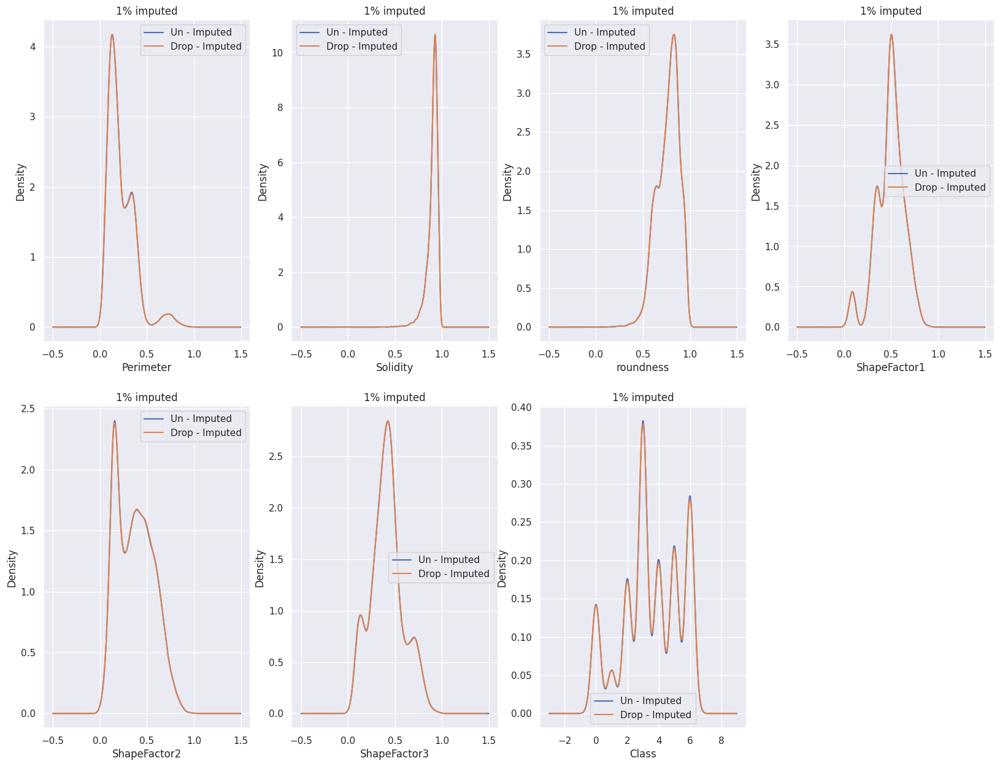

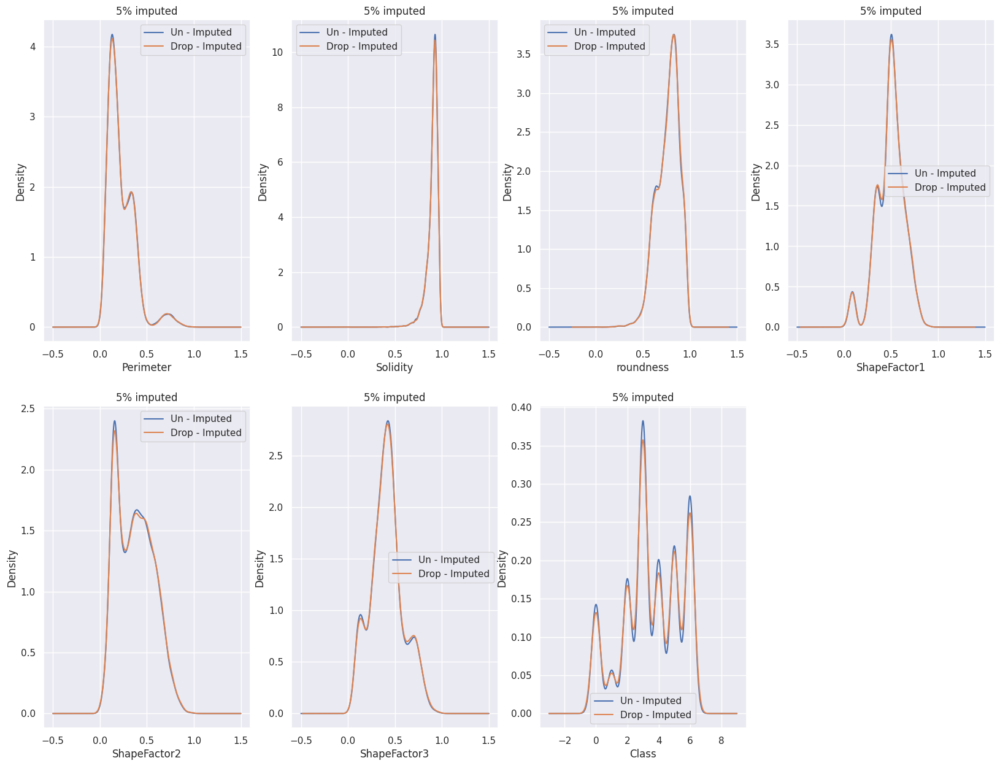

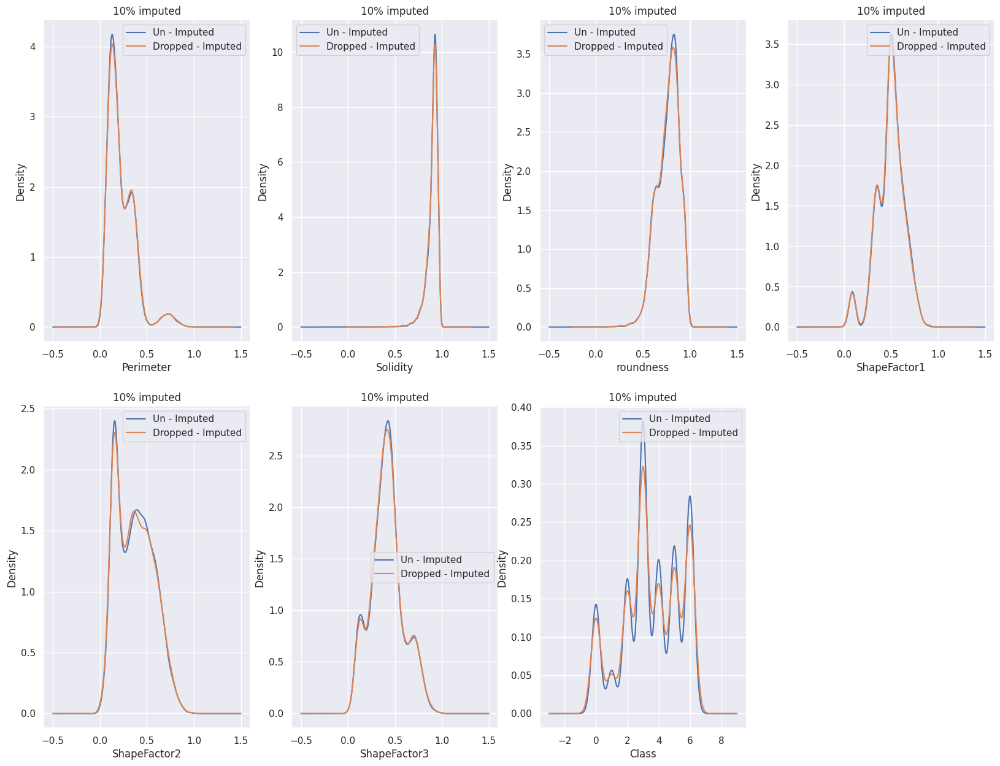

In [27]:
#1% data

plt.figure(figsize=(20,15))

i = 0
for col in cols[:]:
  plt.subplot(2,4,i+1)
  i+=1
  new_df[col].plot(kind="kde")
  nan_1p_df_drop[col].plot(kind="kde")
  plt.title('1% imputed')
  plt.legend(["Un - Imputed", "Drop - Imputed"])
  plt.xlabel(f"{col}")
  


#5% data
plt.figure(figsize=(20,15))

i = 0
for col in cols[:]:
  plt.subplot(2,4,i+1)
  i+=1
  new_df[col].plot(kind="kde")
  nan_5p_df_drop[col].plot(kind="kde")
  plt.title('5% imputed')
  plt.legend(["Un - Imputed", "Drop - Imputed"])
  plt.xlabel(f"{col}")
  

#10% data
plt.figure(figsize=(20,15))

i = 0
for col in cols[:]:
  plt.subplot(2,4,i+1)
  i+=1
  new_df[col].plot(kind="kde")
  nan_10p_df_drop[col].plot(kind="kde")
  plt.title('10% imputed')
  plt.legend(["Un - Imputed", "Dropped - Imputed"])
  plt.xlabel(f"{col}")
  

## Auto ML


In [28]:
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmppt9jf5mu
  JVM stdout: /tmp/tmppt9jf5mu/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmppt9jf5mu/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,02 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.3
H2O_cluster_version_age:,5 days
H2O_cluster_name:,H2O_from_python_unknownUser_mcr9g2
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [29]:
data_h2o = h2o.H2OFrame(data)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [30]:
#splitting the training and testing data 70/30
train, test = data_h2o.split_frame( ratios = [0.70], destination_frames = ["train.hex", "test.hex"], seed = 1234)

In [31]:
# check the number of train set and test set
train["is_train"] = 1
test["is_train"] = 0

drift_data = train.rbind(test)
drift_data["is_train"] = drift_data["is_train"].asfactor()


drift_data["is_train"].table()

is_train,Count
0,4039
1,9572


### Training AutoML Models

In [32]:
x_cols = data_h2o.drop(['Class'],axis=1).columns
y_cols = 'Class'

In [33]:
from h2o.automl import H2OAutoML
# Run AutoML for 10 base models (limited to 1 hour max runtime by default)
aml = H2OAutoML(max_models=15, seed=1234, sort_metric="MAE", project_name = "random_split")
aml.train(x=x_cols, y=y_cols, training_frame=train)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2ORandomForestEstimator : Distributed Random Forest
Model Key: DRF_1_AutoML_1_20230410_25325


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    48                 48                          368637                 20           20           20            569           648           607.792

ModelMetricsRegression: drf
** Reported on train data. **

MSE: 0.44650390505501963
RMSE: 0.6682094769269735
MAE: 0.27942879225883926
RMSLE: 0.19207802094463472
Mean Residual Deviance: 0.44650390505501963

ModelMetricsRegression: drf
** Reported on cross-validation data. **

MSE: 0.4253182113147109
RMSE: 0.652164251791457
MAE: 0.2757111579806203
RMSLE: 0.18660778667488084
Mean Residual Deviance: 0.4253182113147109

Cross-Validation Metrics Summary: 
                        mean      sd          cv_1_valid    cv_2_valid    cv_3_valid    cv_4_valid    cv_5_valid
----------------------  --------  ----------  ------------  ------------  ------------  ------------  ------------
mae                     0.27571   0.0073609   0.282751      0.278469      0.264578      0.280543      0.272209
mean_residual_deviance  0.425319  0.0240676   0.431977      0.411345      0.410977      0.464759      0.407538
mse                     0.425319  0.0240676   0.431977      0.411345      0.410977      0.464759      0.407538
r2                      0.873116  0.00717231  0.871124      0.877163      0.877488      0.861369      0.878438
residual_deviance       0.425319  0.0240676   0.431977      0.411345      0.410977      0.464759      0.407538
rmse                    0.651961  0.0182306   0.657249      0.641362      0.641074      0.681732      0.638387
rmsle                   0.186419  0.00939371  0.185467      0.181005      0.181095      0.202896      0.181633

Scoring History: 
    timestamp            duration    number_of_trees    training_rmse    training_mae    training_deviance
--  -------------------  ----------  -----------------  ---------------  --------------  -------------------
    2023-04-10 02:54:14  13.052 sec  0                  nan              nan             nan
    2023-04-10 02:54:14  13.270 sec  5                  0.841528         0.294208        0.708169
    2023-04-10 02:54:14  13.471 sec  10                 0.773128         0.292983        0.597727
    2023-04-10 02:54:15  13.639 sec  15                 0.721589         0.286448        0.52069
    2023-04-10 02:54:15  13.800 sec  20                 0.702164         0.284008        0.493035
    2023-04-10 02:54:15  13.965 sec  25                 0.684841         0.27891         0.469007
    2023-04-10 02:54:15  14.133 sec  30                 0.680499         0.278596        0.463079
    2023-04-10 02:54:15  14.305 sec  35                 0.675494         0.278976        0.456292
    2023-04-10 02:54:15  14.516 sec  40                 0.672444         0.2793          0.452181
    2023-04-10 02:54:16  14.773 sec  45                 0.670455         0.279544        0.449509
    2023-04-10 02:54:16  14.896 sec  48                 0.668209         0.279429        0.446504

Variable Importances: 
variable         relative_importance    scaled_importance    percentage
---------------  ---------------------  -------------------  ------------
MinorAxisLength  302251                 1                    0.246162
ShapeFactor1     224079                 0.741367             0.182496
ConvexArea       202958                 0.671489             0.165295
Perimeter        84353.7                0.279085             0.0687002
EquivDiameter    80501                  0.266339             0.0655625
MajorAxisLength  78558.9                0.259913             0.0639807
roundness        52602.9                

In [34]:
# View the AutoML Leaderboard
lb = aml.leaderboard
lb.head() 

model_id,mae,rmse,mse,rmsle,mean_residual_deviance
DRF_1_AutoML_1_20230410_25325,0.275711,0.652164,0.425318,0.186608,0.425318
XRT_1_AutoML_1_20230410_25325,0.277928,0.656425,0.430894,0.188357,0.430894
StackedEnsemble_AllModels_1_AutoML_1_20230410_25325,0.282259,0.639238,0.408626,0.184539,0.408626
StackedEnsemble_BestOfFamily_1_AutoML_1_20230410_25325,0.28234,0.642988,0.413433,0.185072,0.413433
GBM_grid_1_AutoML_1_20230410_25325_model_1,0.282895,0.64965,0.422045,0.186132,0.422045
GBM_4_AutoML_1_20230410_25325,0.288496,0.651178,0.424032,0.186743,0.424032
GBM_3_AutoML_1_20230410_25325,0.28893,0.648297,0.420289,0.187478,0.420289
GBM_2_AutoML_1_20230410_25325,0.291055,0.644983,0.416003,nan,0.416003
GBM_5_AutoML_1_20230410_25325,0.298916,0.651647,0.424644,0.194011,0.424644
GBM_1_AutoML_1_20230410_25325,0.331514,0.65601,0.430349,0.205008,0.430349


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_AllModels_1_AutoML_1_20230410_25325,0.670354,0.449374,0.290259,0.191427,0.449374,4414,0.153513,StackedEnsemble
GBM_5_AutoML_1_20230410_25325,0.673542,0.453658,0.303277,0.197761,0.453658,764,0.017384,GBM
StackedEnsemble_BestOfFamily_1_AutoML_1_20230410_25325,0.674962,0.455573,0.292395,0.191393,0.455573,2034,0.069144,StackedEnsemble
GBM_3_AutoML_1_20230410_25325,0.677581,0.459116,0.294272,0.199748,0.459116,1428,0.018337,GBM
GBM_2_AutoML_1_20230410_25325,0.681053,0.463833,0.298388,nan,0.463833,1408,0.018182,GBM
XRT_1_AutoML_1_20230410_25325,0.681631,0.464621,0.286447,0.192726,0.464621,3983,0.019795,DRF
GBM_grid_1_AutoML_1_20230410_25325_model_1,0.685891,0.470447,0.293123,0.194003,0.470447,1175,0.018474,GBM
GBM_4_AutoML_1_20230410_25325,0.68601,0.470609,0.295832,0.196003,0.470609,1106,0.019607,GBM
GBM_1_AutoML_1_20230410_25325,0.687504,0.472662,0.331982,0.201779,0.472662,3257,0.032963,GBM
DRF_1_AutoML_1_20230410_25325,0.688929,0.474623,0.287917,0.194956,0.474623,1848,0.020331,DRF


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

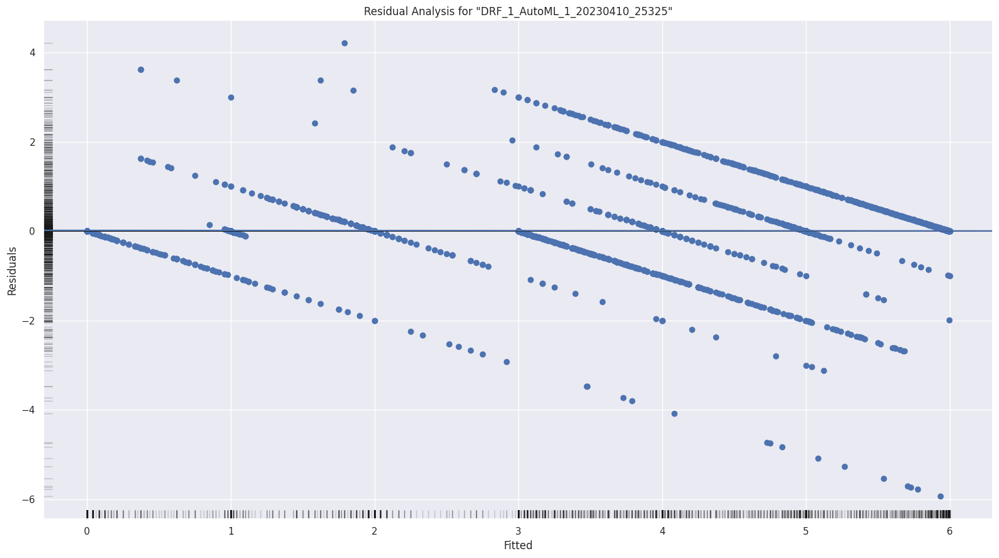

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

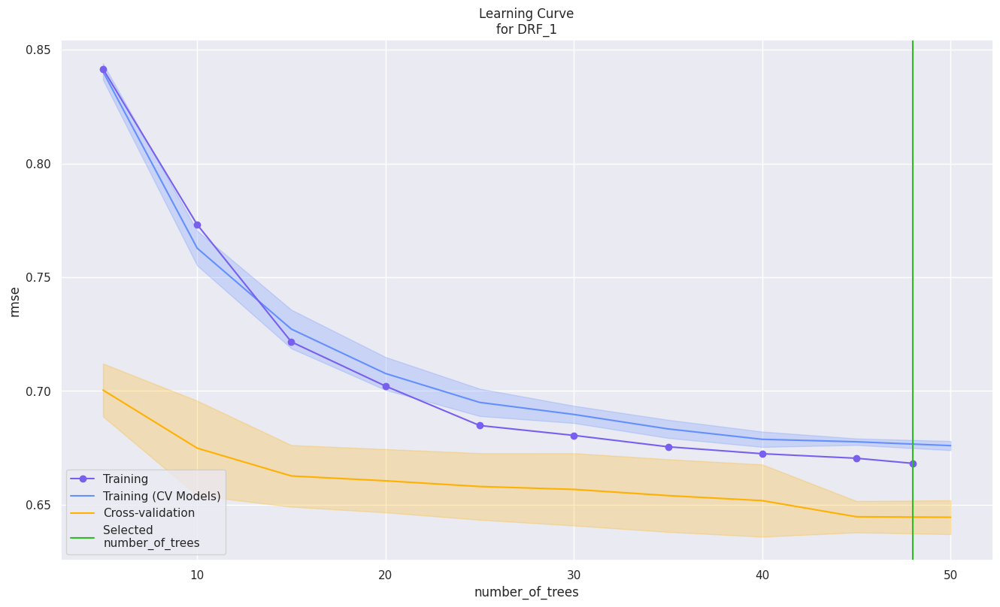

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

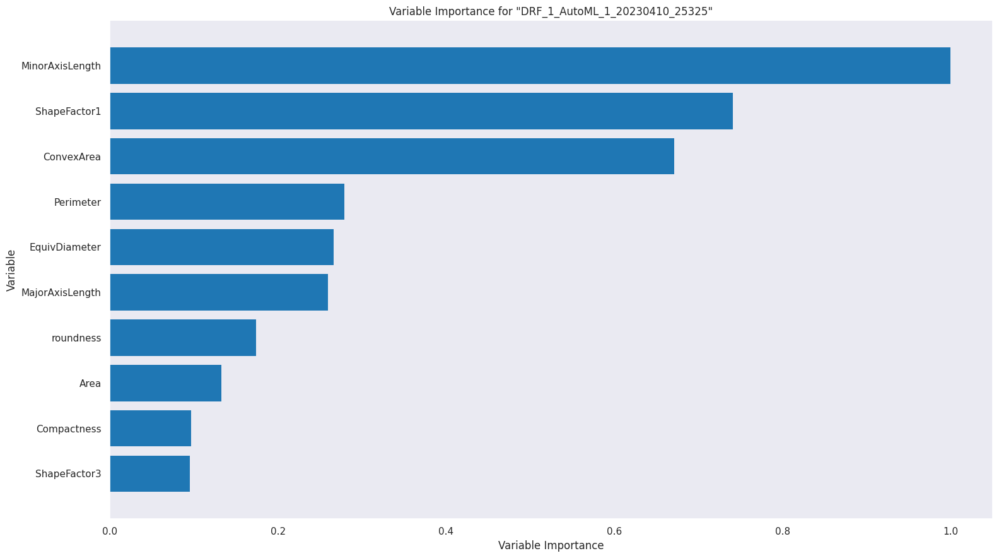

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

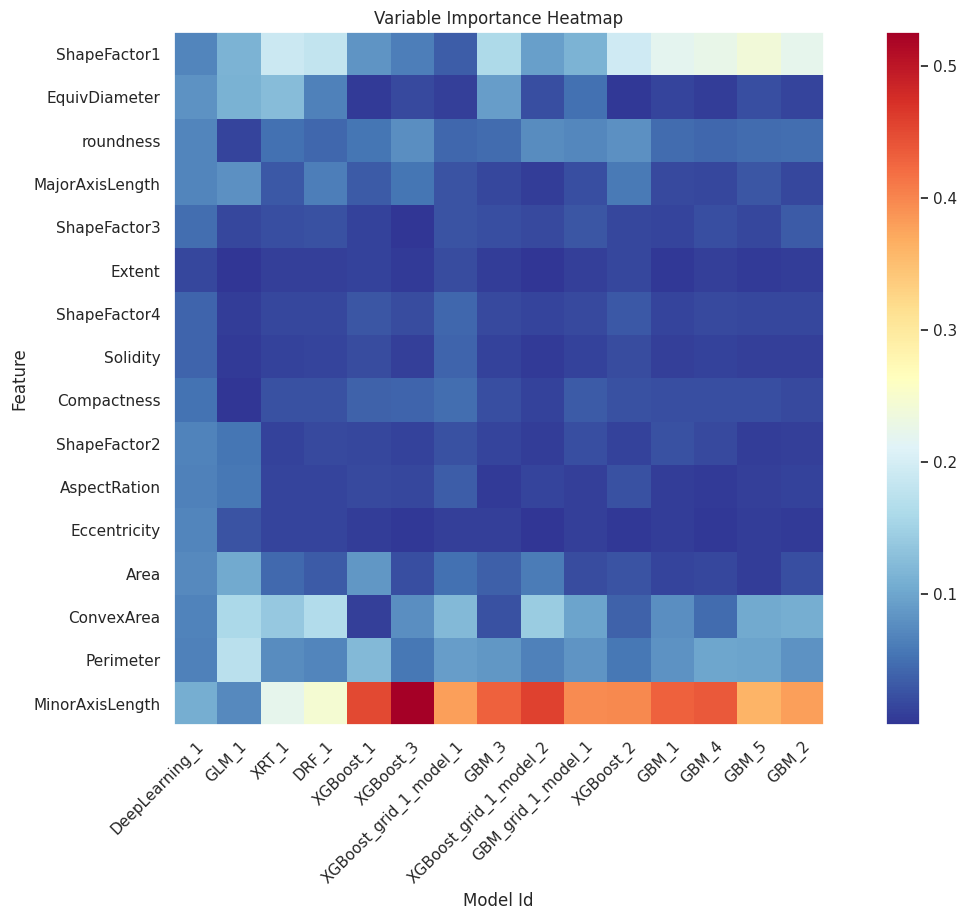

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

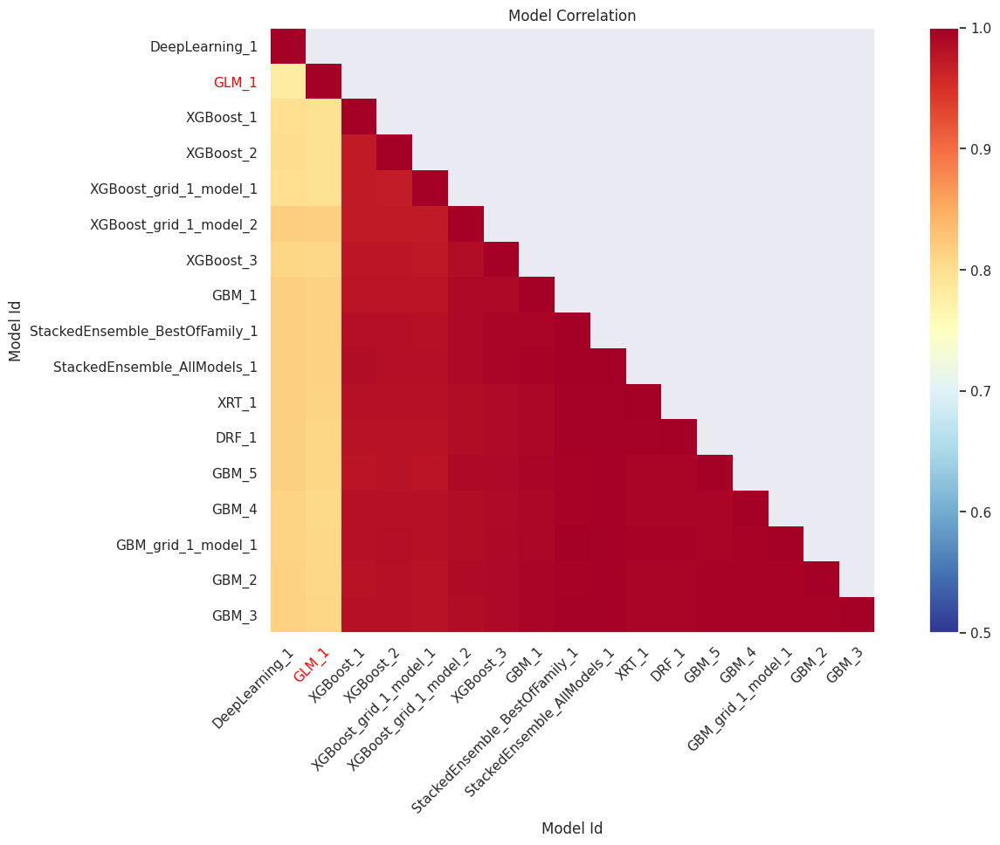

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

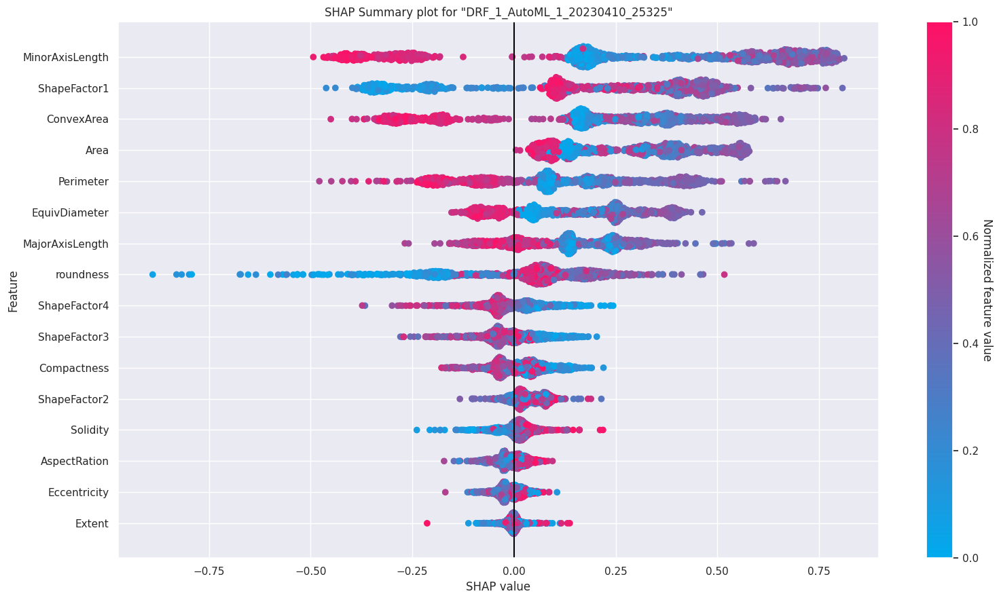

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

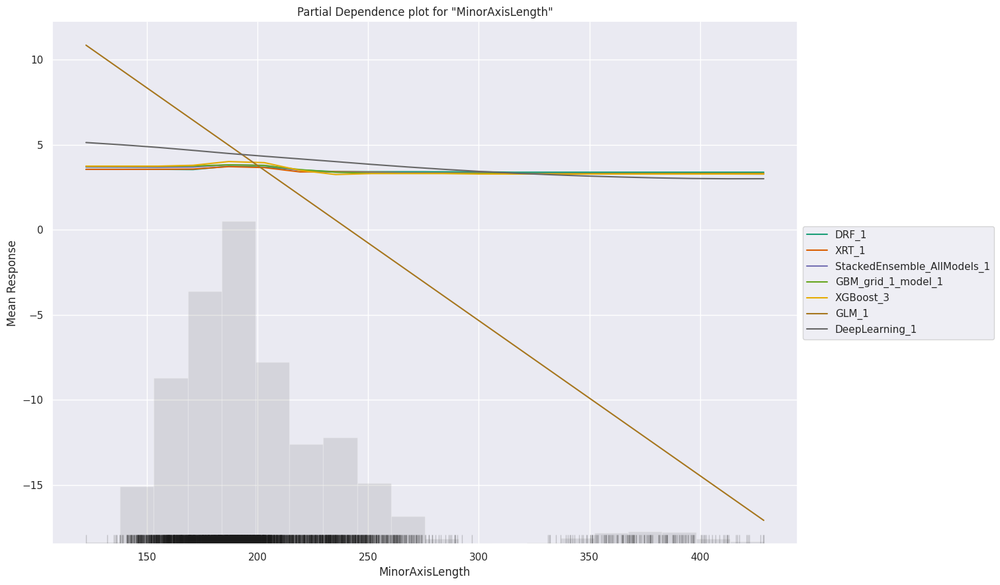

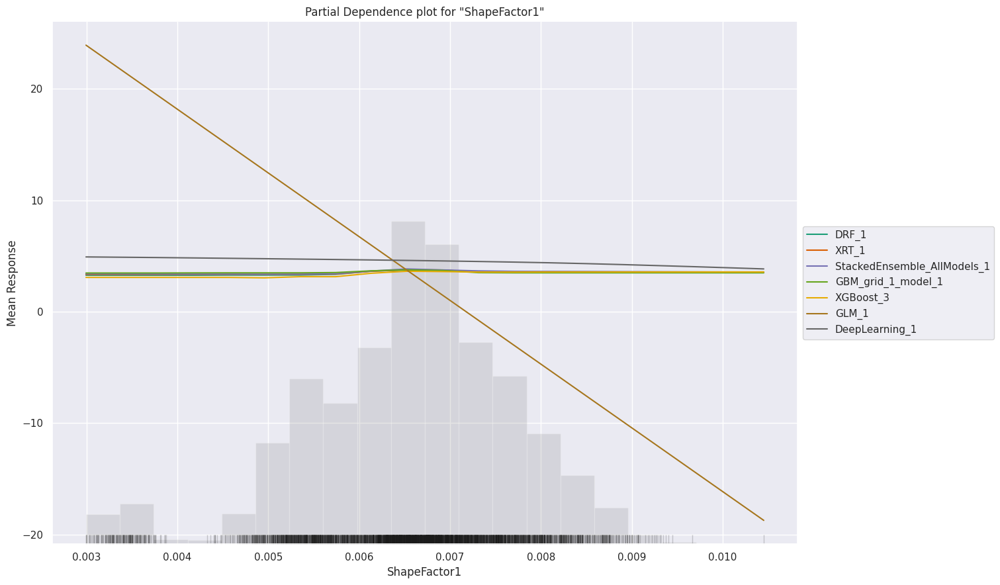

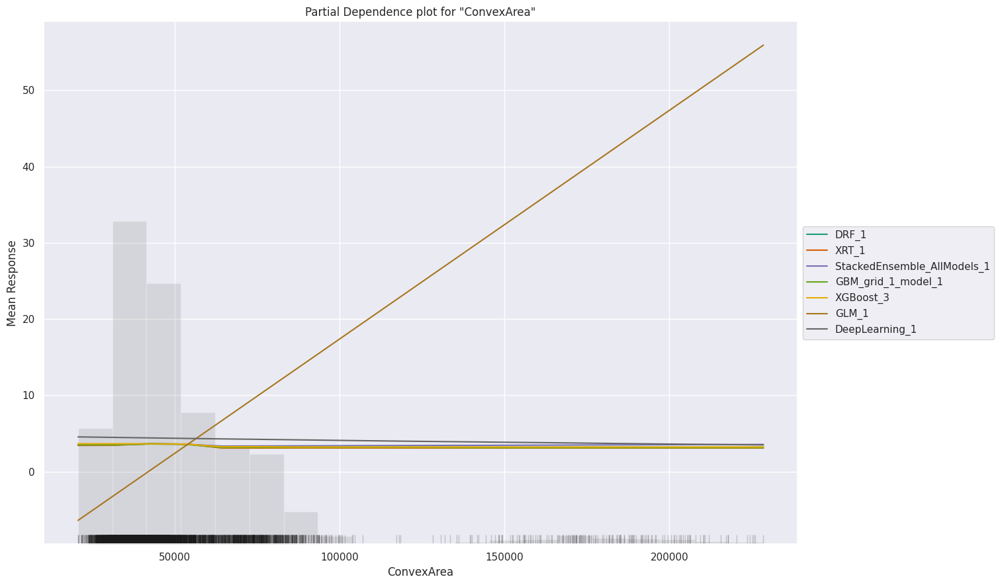

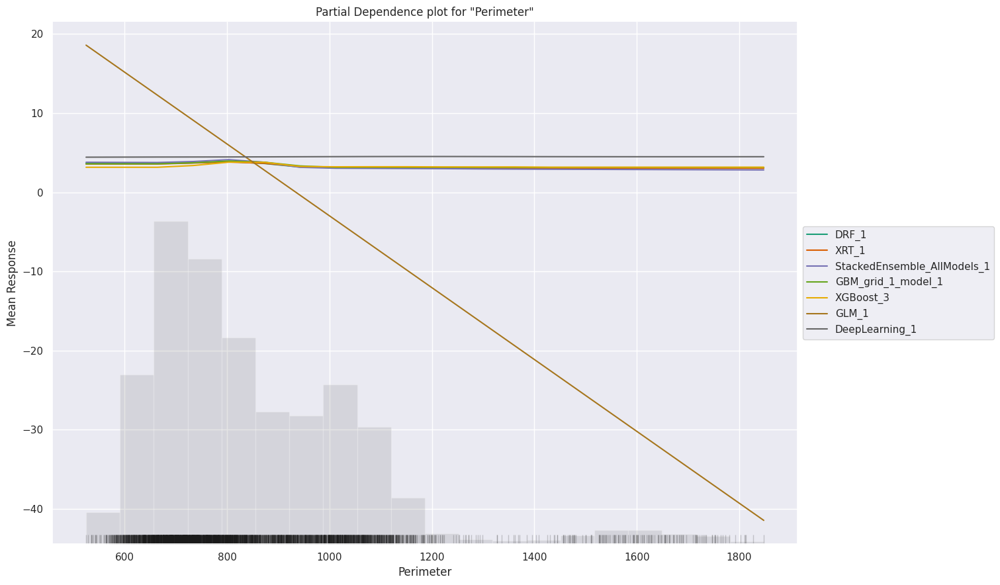

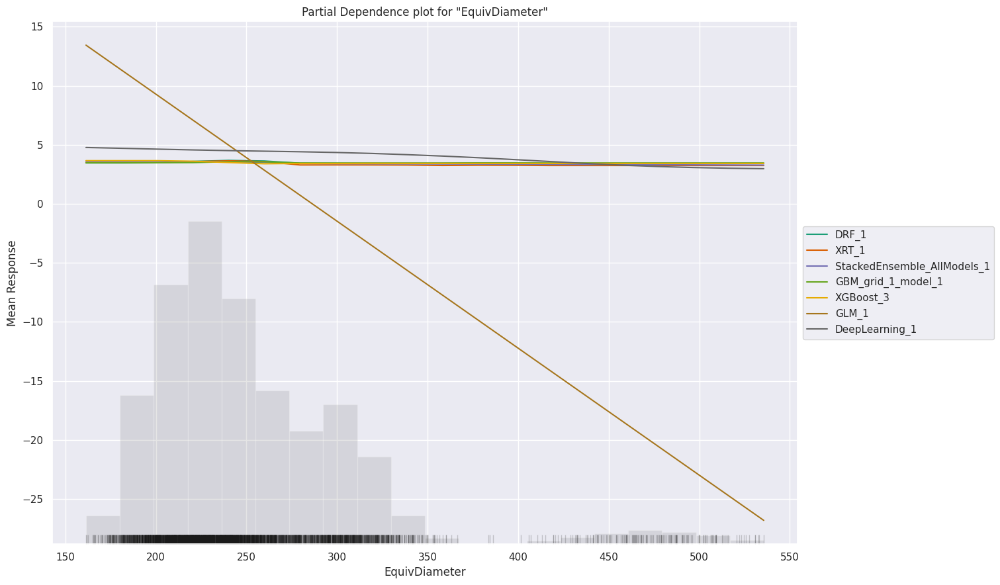

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

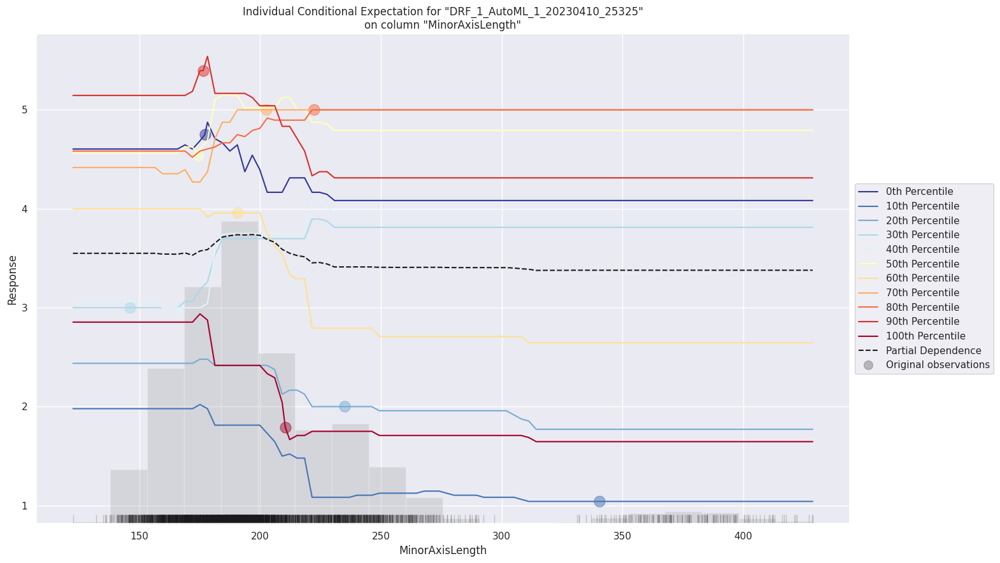

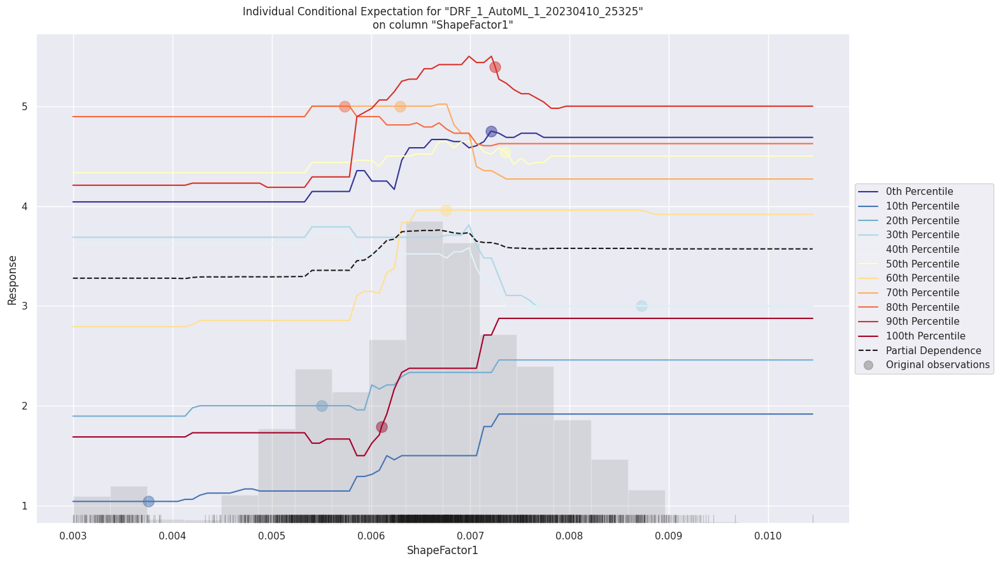

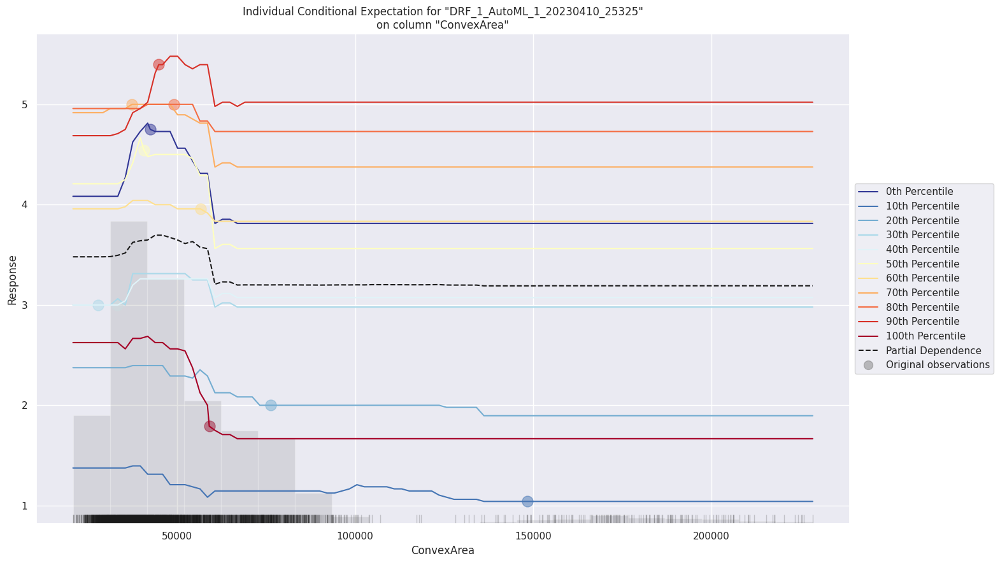

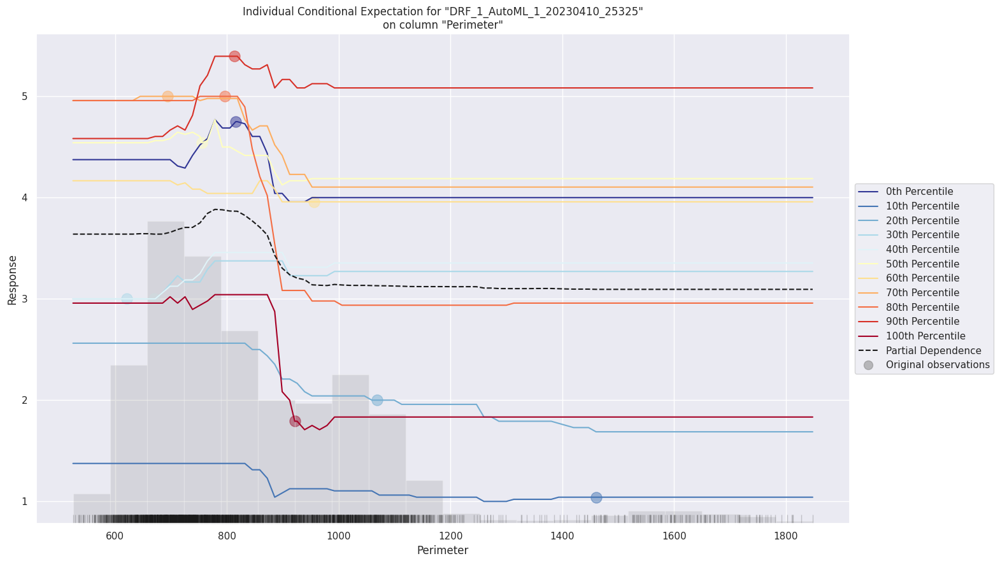

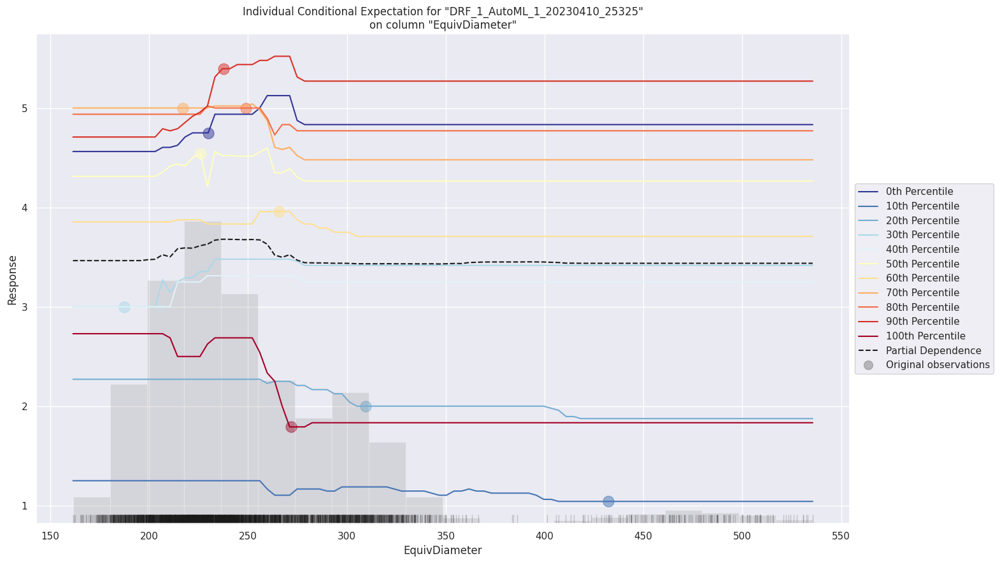

In [35]:
from h2o import explanation
explanation = aml.explain(test)

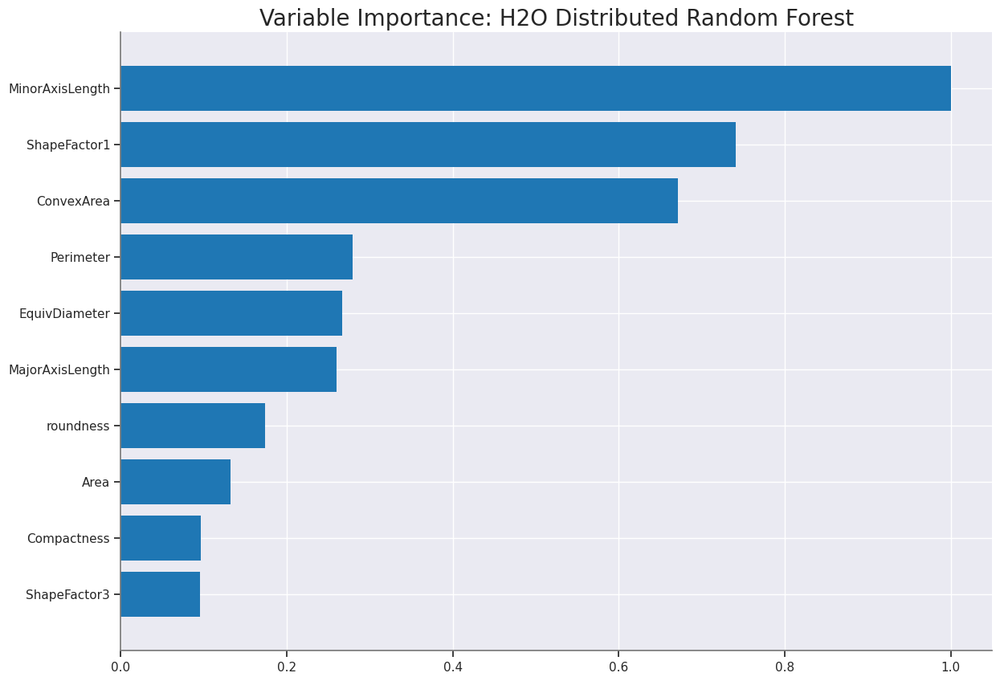

<Figure size 2500x2500 with 0 Axes>

In [36]:
best_model = aml.leader
best_model.model_performance(test)
# %matplotlib inline
best_model.varimp_plot()

### Hyper-Parameter

In [42]:
train, validate, test = np.split(
    data.sample(frac=1, random_state=42), [int(0.6 * len(data)), int(0.8 * len(data))]
)

train = h2o.H2OFrame(train)
validate = h2o.H2OFrame(validate)
test = h2o.H2OFrame(test)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [43]:
gbm_parameters = {
    "learn_rate": [i * 0.01 for i in range(1, 11)],
    "max_depth": list(range(2, 11)),
    "sample_rate": [i * 0.1 for i in range(5, 11)],
    "col_sample_rate": [i * 0.1 for i in range(1, 11)],
}

In [44]:

search_criteria = {"strategy": "RandomDiscrete", "max_models": 36, "seed": 1}

In [45]:
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch


gbm_grid2 = H2OGridSearch(
    model=H2OGradientBoostingEstimator,
    grid_id="gbm_grid2",
    hyper_params=gbm_parameters,
    search_criteria=search_criteria,
)



In [46]:
hyper_params = {'max_depth': [5, 10, 15],
                'sample_rate': [0.8, 1.0],
                'col_sample_rate': [0.8, 1.0]}

In [47]:
from h2o.grid.grid_search import H2OGridSearch

grid = H2OGridSearch(model=H2OGradientBoostingEstimator(seed=1234),
                     hyper_params=hyper_params,
                     search_criteria={'strategy': 'Cartesian'})

In [48]:

grid.train(x=train.columns[:-1], y=train.columns[-1], training_frame=train, validation_frame=test)

gbm Grid Build progress: |███████████████████████████████████████████████████████| (done) 100%


,col_sample_rate,max_depth,sample_rate,model_ids,residual_deviance
,0.8,10.0,0.8,Grid_GBM_Key_Frame__upload_8946d2df289782537cc463a0db043c7.hex_model_python_1681095197144_17_model_3,0.5075699
,0.8,15.0,0.8,Grid_GBM_Key_Frame__upload_8946d2df289782537cc463a0db043c7.hex_model_python_1681095197144_17_model_5,0.5151577
,1.0,15.0,0.8,Grid_GBM_Key_Frame__upload_8946d2df289782537cc463a0db043c7.hex_model_python_1681095197144_17_model_6,0.5176835
,1.0,10.0,1.0,Grid_GBM_Key_Frame__upload_8946d2df289782537cc463a0db043c7.hex_model_python_1681095197144_17_model_10,0.5237593
,0.8,10.0,1.0,Grid_GBM_Key_Frame__upload_8946d2df289782537cc463a0db043c7.hex_model_python_1681095197144_17_model_9,0.5244469
,1.0,10.0,0.8,Grid_GBM_Key_Frame__upload_8946d2df289782537cc463a0db043c7.hex_model_python_1681095197144_17_model_4,0.5249120
,0.8,15.0,1.0,Grid_GBM_Key_Frame__upload_8946d2df289782537cc463a0db043c7.hex_model_python_1681095197144_17_model_11,0.5328283
,1.0,5.0,1.0,Grid_GBM_Key_Frame__upload_8946d2df289782537cc463a0db043c7.hex_model_python_1681095197144_17_model_8,0.5368716
,0.8,5.0,0.8,Grid_GBM_Key_Frame__upload_8946d2df289782537cc463a0db043c7.hex_model_python_1681095197144_17_model_1,0.5372300
,0.8,5.0,1.0,Grid_GBM_Key_Frame__upload_8946d2df289782537cc463a0db043c7.hex_model_python_1681095197144_17_model_7,0.5408231


In [49]:
list_hyperparameters = []
for i in range(10):
    hyperparameters = grid.get_hyperparams_dict(i)
    list_hyperparameters.append(hyperparameters)

Hyperparameters: [max_depth, sample_rate, col_sample_rate]
Hyperparameters: [max_depth, sample_rate, col_sample_rate]
Hyperparameters: [max_depth, sample_rate, col_sample_rate]
Hyperparameters: [max_depth, sample_rate, col_sample_rate]
Hyperparameters: [max_depth, sample_rate, col_sample_rate]
Hyperparameters: [max_depth, sample_rate, col_sample_rate]
Hyperparameters: [max_depth, sample_rate, col_sample_rate]
Hyperparameters: [max_depth, sample_rate, col_sample_rate]
Hyperparameters: [max_depth, sample_rate, col_sample_rate]
Hyperparameters: [max_depth, sample_rate, col_sample_rate]


### Explanation of each of the hyperparameters mentioned:

learn_rate: This hyperparameter controls the step size taken during the optimization process in gradient-based algorithms such as Gradient Boosting Machines (GBM) or XGBoost. A smaller learning rate can lead to slower convergence but can result in a more accurate model.

max_depth: This hyperparameter controls the maximum depth of a tree in decision tree-based algorithms such as Random Forest or XGBoost. A larger value of max_depth can result in a more complex model that can capture more intricate relationships in the data, but can also increase the risk of overfitting.

sample_rate: This hyperparameter controls the fraction of rows (observations) to be randomly sampled at each iteration during the training process in gradient-based algorithms such as GBM or XGBoost. A smaller value of sample_rate

col_sample_rate: is a hyperparameter used in machine learning algorithms for feature selection and regularization. It refers to the fraction of columns (features) that are randomly selected for each tree or iteration during the construction of a random forest or gradient boosting model.

In [50]:
models = grid.models
list_residual_deviance = []
for i in range(10):
    model = models[i]
    performance_metrics = model.model_performance(validate)
    residual_deviance = performance_metrics.mean_residual_deviance()
    list_residual_deviance.append(residual_deviance)

In [51]:

for i in range(10):
    list_hyperparameters[i]["Residual_Deviance"] = list_residual_deviance[i]
hyperparameters_dataframe = pd.DataFrame(list_hyperparameters)
print(hyperparameters_dataframe)

   col_sample_rate  max_depth  sample_rate  Residual_Deviance
0              0.8         10          0.8           0.419424
1              0.8         15          0.8           0.429054
2              1.0         15          0.8           0.437737
3              1.0         10          1.0           0.425859
4              0.8         10          1.0           0.424310
5              1.0         10          0.8           0.427454
6              0.8         15          1.0           0.435048
7              1.0          5          1.0           0.430960
8              0.8          5          0.8           0.431044
9              0.8          5          1.0           0.433887


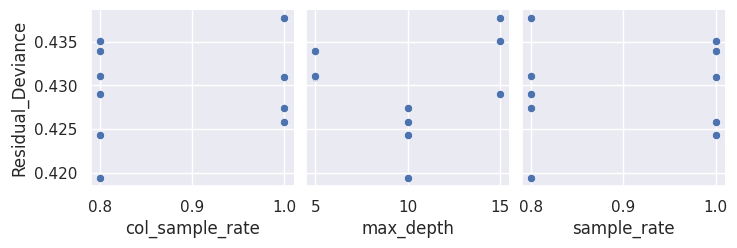

In [52]:
sns.pairplot(
    hyperparameters_dataframe,
    y_vars=["Residual_Deviance"],
    x_vars=["col_sample_rate", "max_depth", "sample_rate"],
)

## Regularization


GLM models with Ridge and Lasso regularization techniques are commonly used in linear regression to prevent overfitting and improve the model's ability to generalize to new data. Ridge regularization works by adding a penalty term to the least-squares objective function of the linear regression model that is proportional to the square of the magnitude of the coefficients. This penalty term helps to shrink the coefficients towards zero, thereby reducing the effect of correlated input variables and improving the model's performance. The strength of the penalty is controlled by a hyperparameter that needs to be tuned to optimize performance. Lasso regularization, on the other hand, adds a penalty term proportional to the absolute value of the coefficients, which can set some coefficients to exactly zero and effectively remove irrelevant variables from the model. The main difference between Ridge and Lasso regularization is the type of penalty function used, with Ridge using L2 regularization and Lasso using L1 regularization. The choice between these techniques depends on the specific problem and input variables.

In [53]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator

params = {"family": "multinomial", "nfolds": 5}

imdb_glm = H2OGeneralizedLinearEstimator(lambda_=0, compute_p_values=True, **params)
imdb_glm_regularization_ridge = H2OGeneralizedLinearEstimator(alpha=0, **params)
imdb_glm_regularization_lasso = H2OGeneralizedLinearEstimator(alpha=1, **params)
imdb_glm_regularization_lamba_search = H2OGeneralizedLinearEstimator(lambda_search=True)

This code defines several H2O GLM models with a common set of hyperparameters by first creating a dictionary params that contains the common parameters, including the family type (Multinomial) and the number of cross-validation folds (nfolds) set to 5.

The H2OGeneralizedLinearEstimator function is then used to create four different GLM models, each with a slightly different set of hyperparameters:

imdb_glm is a GLM model with Elastic Net regularization, set by the lambda_=0 parameter and with compute_p_values set to True. The **params syntax at the end of the line passes the dictionary of common parameters to the H2OGeneralizedLinearEstimator function, which will apply those parameters to this model.

imdb_glm_regularization_ridge is a GLM model with Ridge regularization, set by the alpha=0 parameter. It also uses the common parameters defined in the params dictionary.

imdb_glm_regularization_lasso is a GLM model with LASSO regularization, set by the alpha=1 parameter. It also uses the common parameters defined in the params dictionary.

imdb_glm_regularization_lamba_search is a GLM model that uses lambda search to automatically determine the optimal value for the regularization parameter lambda. It does not specify any of the common hyperparameters, so they will default to their H2O library defaults.

By using a dictionary to define the common hyperparameters, the code simplifies the process of creating multiple similar models with slightly different hyperparameters, reducing code duplication and making the code easier to read and maintain.

In [54]:

data_h2o.isna().sum()

0.0

In [55]:
data_h2o.describe()


Rows:13611
Cols:17

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
type,int,real,real,real,real,real,int,real,real,real,real,real,real,real,real,real,int
mins,20420.0,524.736,183.601165,122.5126535,1.024867596,0.218951263,20684.0,161.2437642,0.555314717,0.919246157,0.489618256,0.640576759,0.002778013,0.000564169,0.410338584,0.947687403,0.0
mean,53048.28454926143,855.2834585996623,320.1418673032211,202.27071408288194,1.5832419790188055,0.7508949293723429,53768.20020571567,253.06421992490573,0.7497327873564006,0.9871428435655739,0.873281831305416,0.7998636818695884,0.006563608507383733,0.001715947338917045,0.6435901812970398,0.9950633118301396,3.532657409448232
maxs,254616.0,1985.37,738.8601535,460.1984968,2.430306447,0.911422968,263261.0,569.3743583,0.866194641,0.9946775,0.9906854,0.987302969,0.010451169,0.003664972,0.974767153,0.99973253,6.0
sigma,29324.09571688207,214.28969589196154,85.6941859593335,44.9700912941147,0.24667845568580432,0.09200176320620888,29774.915817000012,59.17712014871156,0.049086366843964224,0.004660379169838,0.05951988794941862,0.06171346311682412,0.0011279982248070671,0.0005958748528937661,0.098996150476599,0.004366457746633824,1.828708802411996
zeros,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1322
missing,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,28395.0,610.291,208.1781167,173.888747,1.197191424,0.549812187,28715.0,190.1410973,0.763922518,0.988855999,0.958027126,0.913357755,0.007331506,0.003147289,0.834222388,0.998723889,5.0
1,28734.0,638.018,200.5247957,182.7344194,1.097356461,0.411785251,29172.0,191.2727505,0.783968133,0.984985603,0.887033637,0.953860842,0.006978659,0.003563624,0.909850506,0.998430331,5.0
2,29380.0,624.11,212.8261299,175.9311426,1.209712656,0.562727317,29690.0,193.4109041,0.778113248,0.989558774,0.947849473,0.908774239,0.007243912,0.003047733,0.825870617,0.999066137,5.0


In [ ]:
# Taking 20 samples out for SHAP linear analysis as it is a computationally expensive process

X_train_shap_sample = shap.utils.sample(
    X_train, 150
)  
x_test_shap_sample = shap.utils.sample(
    X_test, 150
)  

## Linear model fitting using Logistic Regression

In [71]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

LR = LogisticRegression(penalty='l2',multi_class='multinomial',max_iter=500) 

LR.fit(X_train,y_train)

y_pred = LR.predict(X_test)


score = LR.score(X_test, y_test)

print('\nAccuracy: ',score)


Accuracy:  0.9171319424037614


In [72]:
LR.coef_.shape, LR.intercept_.shape

((7, 16), (7,))

Text(0.5, 43.249999999999986, 'Predicted label')

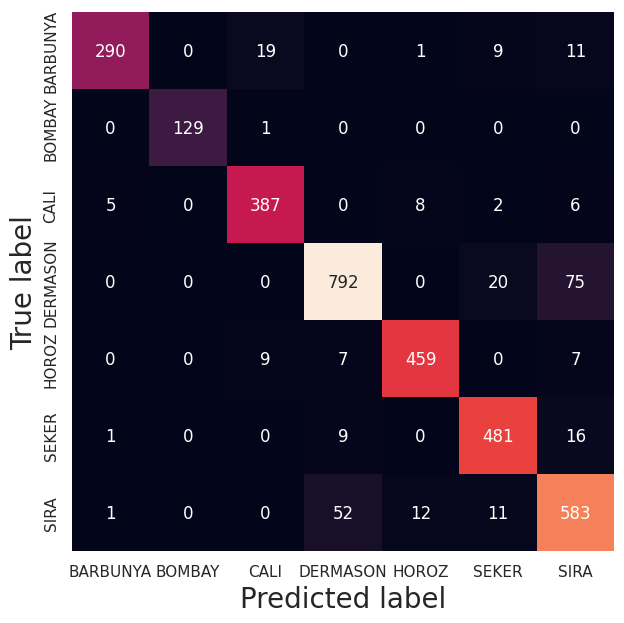

In [73]:
conf_mat = metrics.confusion_matrix(y_test, y_pred)
# print(conf_mat)
# labels = ['True','Predicted']
# stats_text = "\n\nAccuracy={:0.3f}\nPrecision={:0.3f}\nRecall={:0.3f}\nF1 Score={:0.3f}".format(accuracy,precision,recall,f1_score)
plt.figure(figsize=(7,7))
sns.heatmap(conf_mat, annot=True, fmt= '.0f',cbar=False,xticklabels=classes,yticklabels=classes)

plt.ylabel('True label',fontsize=20)
plt.xlabel('Predicted label',fontsize=20)

### Tree Model fitting using Random forest Classifier

In [74]:
from sklearn.model_selection import train_test_split
X = data_norm.drop(columns = ['Class'])
y = data_norm['Class']
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42)

In [75]:
from sklearn.ensemble import RandomForestClassifier

feature_names = [f"feature {i}" for i in range(X.shape[1])]
forest = RandomForestClassifier(random_state=0, max_depth = 3)
forest.fit(X_train, y_train)
score = forest.score(X_test,y_test)
print("Accuracy :" ,score)

Accuracy : 0.7754922127534528


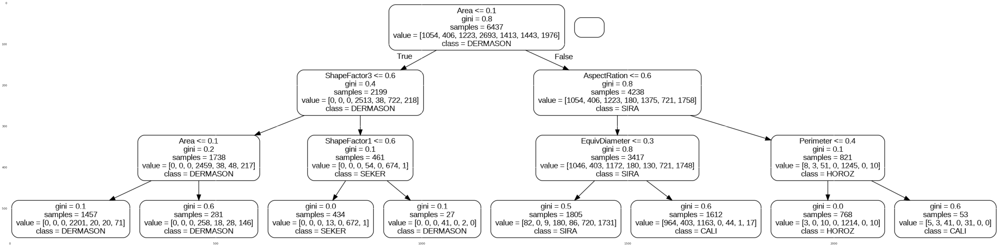

In [76]:
from matplotlib.pyplot import figure
from sklearn.tree import export_graphviz
import pydot
import matplotlib.image as mpimg


# Visualization of Nodes for the purpose of explainability
figure(figsize=(70, 150), dpi=80)
tree = forest.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=list(X_train.columns),
    rounded=True,
    precision=1,
    class_names=['BARBUNYA', 'BOMBAY', 'CALI', 'DERMASON', 'HOROZ', 'SEKER', 'SIRA'] 
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()

Interpreting Nodes of a Tree-Based Model

Random Forest Regressor works on the concept of the wisdom of the crowd. The above decision tree is one of the many trees involved in predicting the target variable. Each decision tree regression predicts a number as an output for a given input. Random forest regression takes the average of those predictions as its final output.

As usual, the tree has conditions on each internal node and a value associated with each leaf (i.e. the value to be predicted). But additionally, we’ve plotted out the value at each internal node i.e. the mean of the response variables in that region.

In [77]:
# Get numerical feature importances
tree_importances = list(forest.feature_importances_)
# List of tuples with variable and importance
feature_importances = [
    (feature, round(importance, 2))
    for feature, importance in zip(X_train.columns, tree_importances)
]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)

In [78]:
# Print out the feature and importances
[print("Variable: {:20} Importance: {}".format(*pair)) for pair in feature_importances];

Variable: Perimeter            Importance: 0.13
Variable: Compactness          Importance: 0.11
Variable: ShapeFactor3         Importance: 0.11
Variable: ShapeFactor1         Importance: 0.1
Variable: MajorAxisLength      Importance: 0.09
Variable: MinorAxisLength      Importance: 0.09
Variable: ConvexArea           Importance: 0.09
Variable: AspectRation         Importance: 0.07
Variable: EquivDiameter        Importance: 0.07
Variable: Area                 Importance: 0.06
Variable: Eccentricity         Importance: 0.06
Variable: ShapeFactor2         Importance: 0.02
Variable: roundness            Importance: 0.01
Variable: Extent               Importance: 0.0
Variable: Solidity             Importance: 0.0
Variable: ShapeFactor4         Importance: 0.0


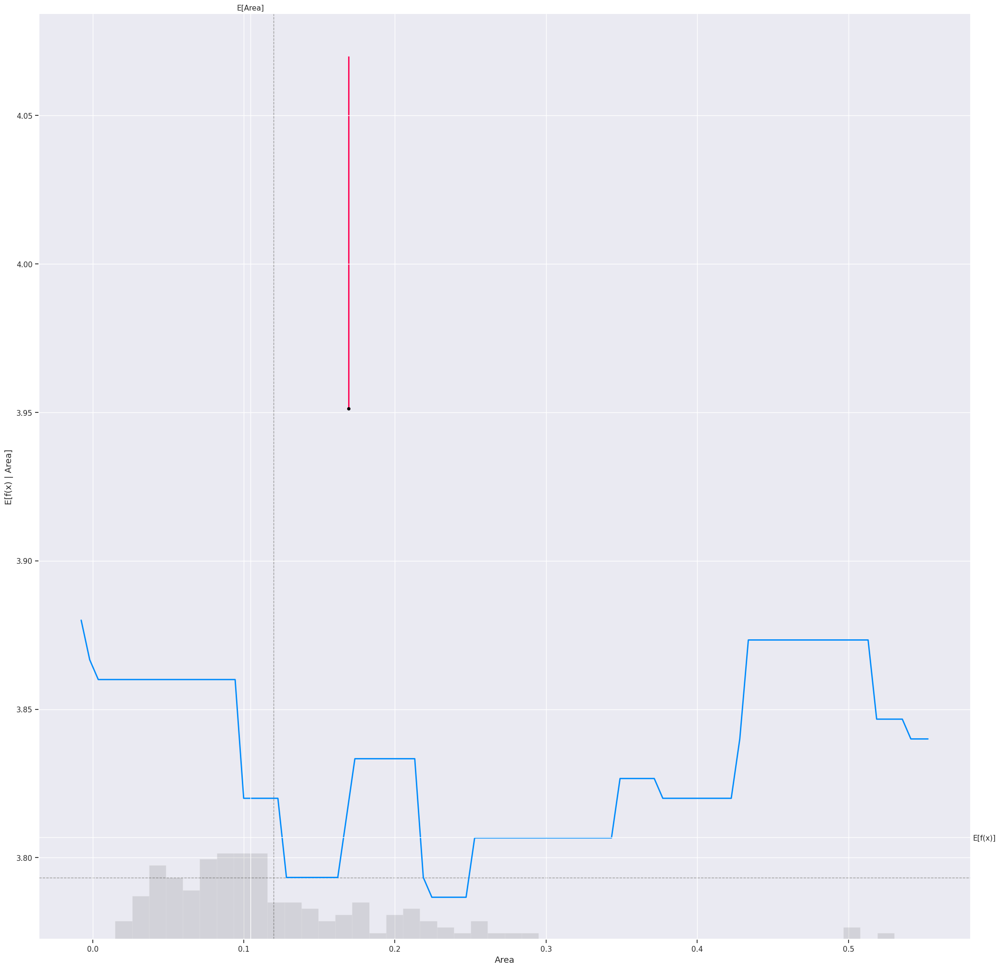

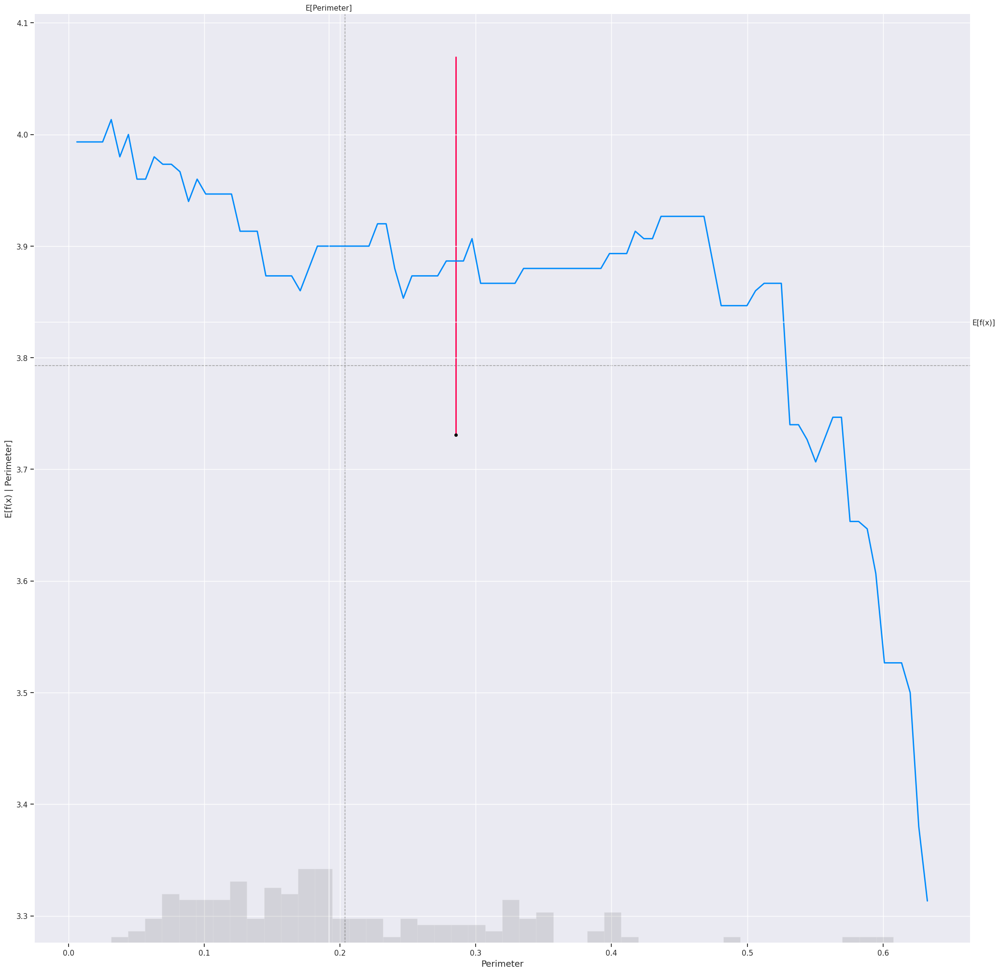

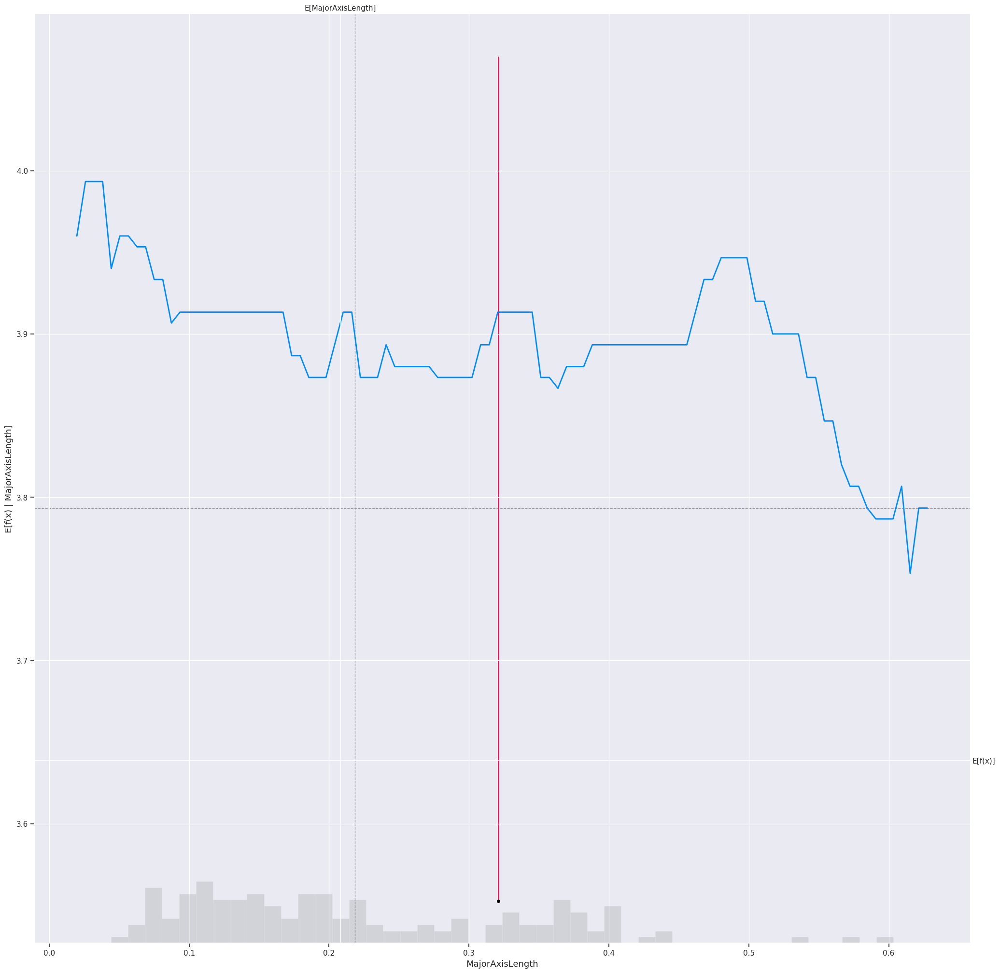

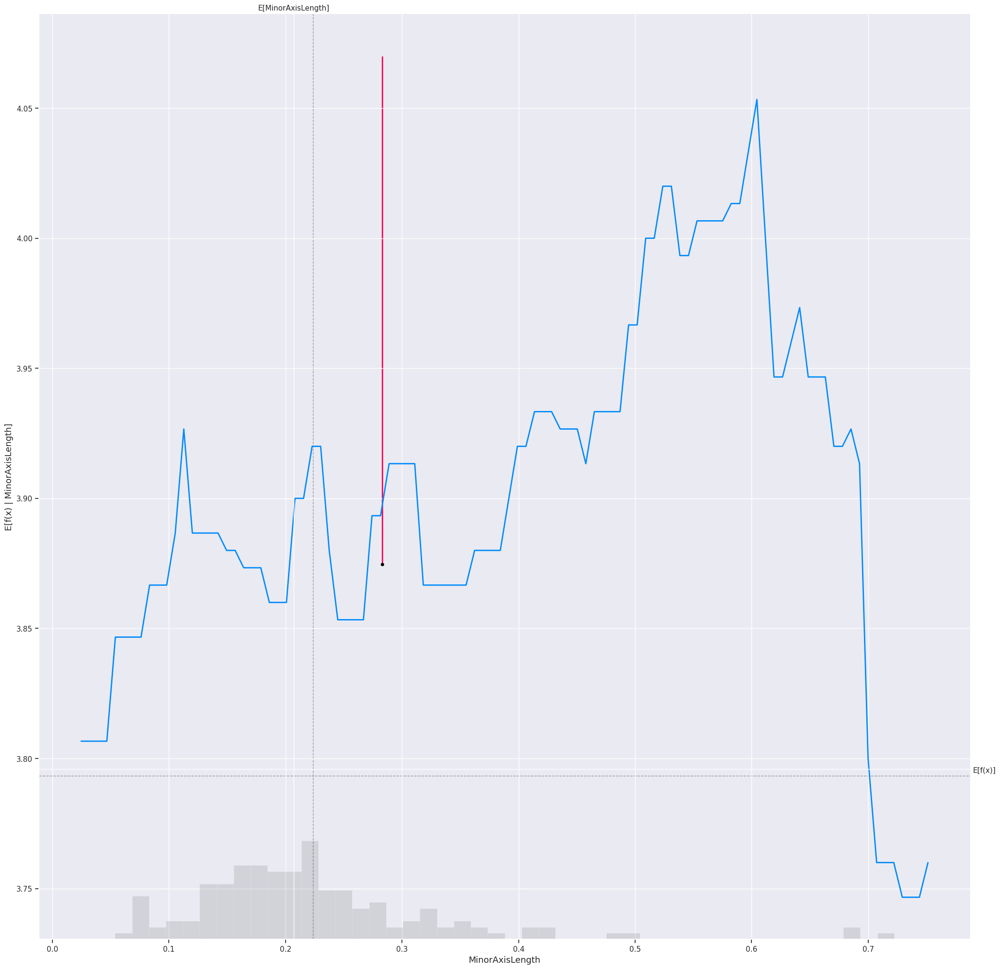

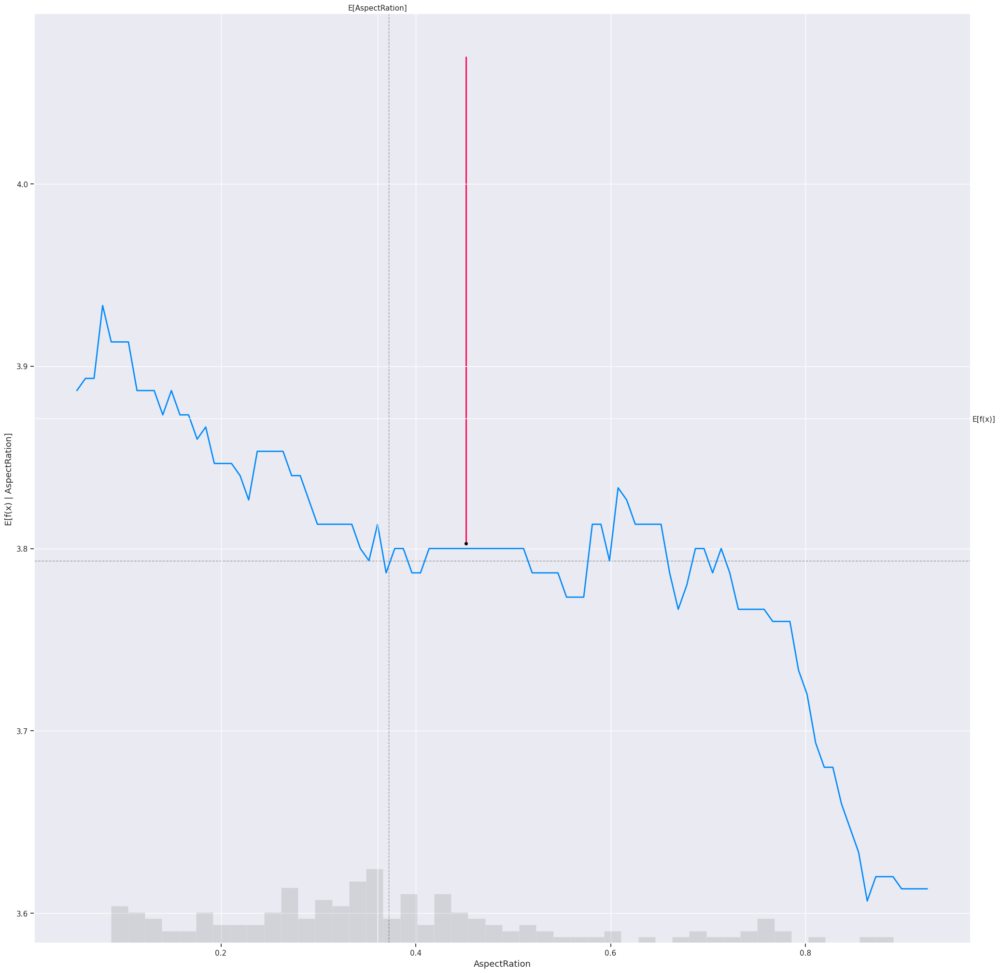

...

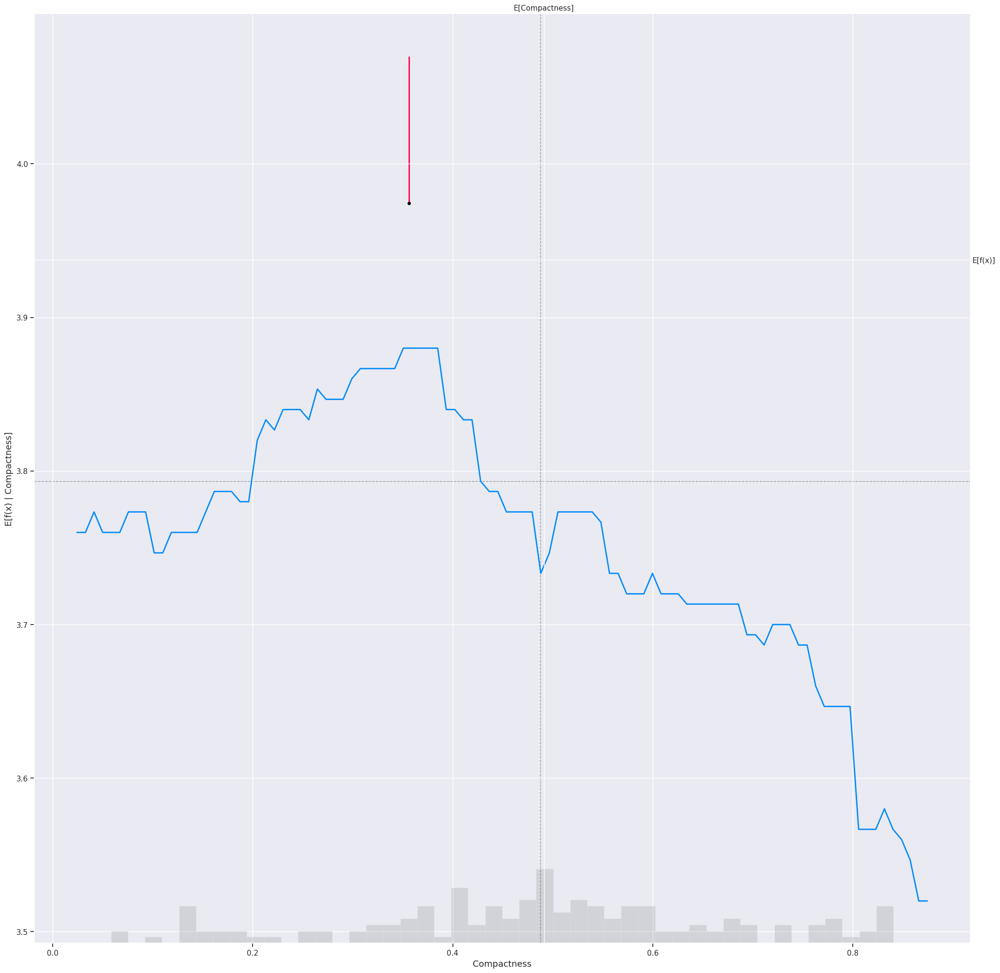

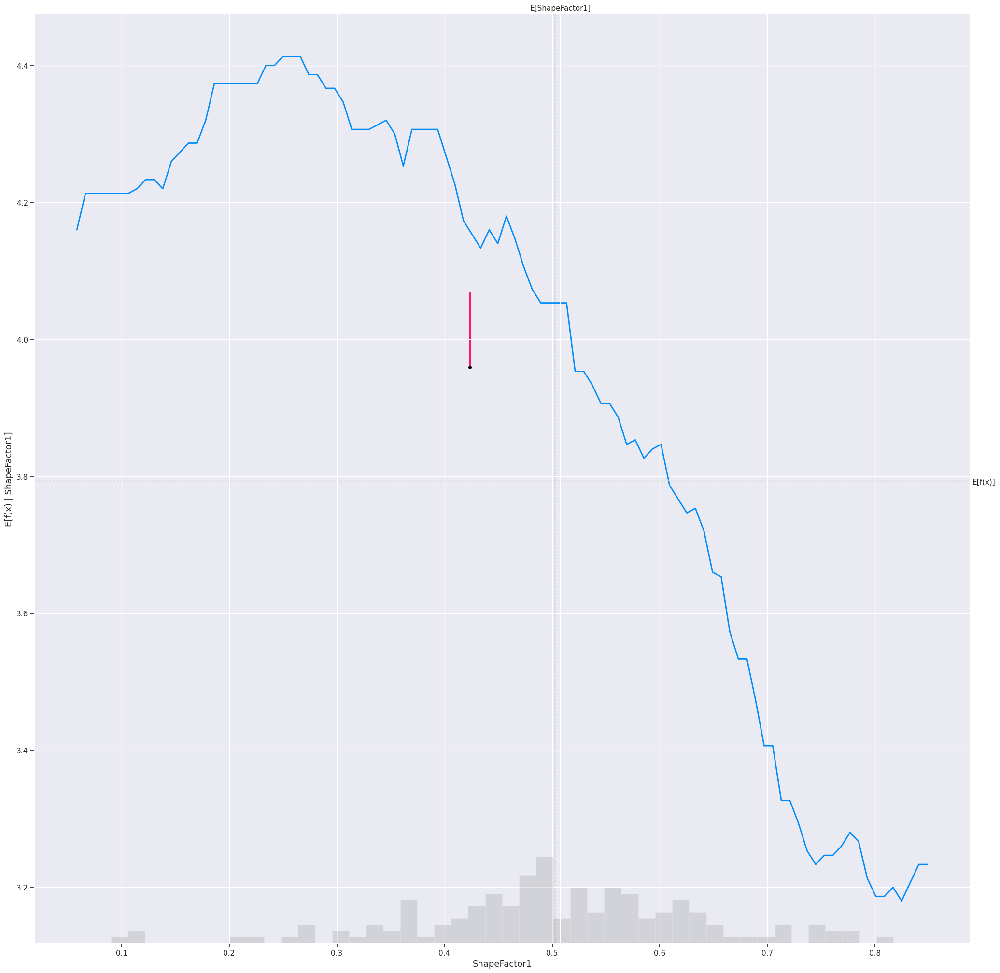

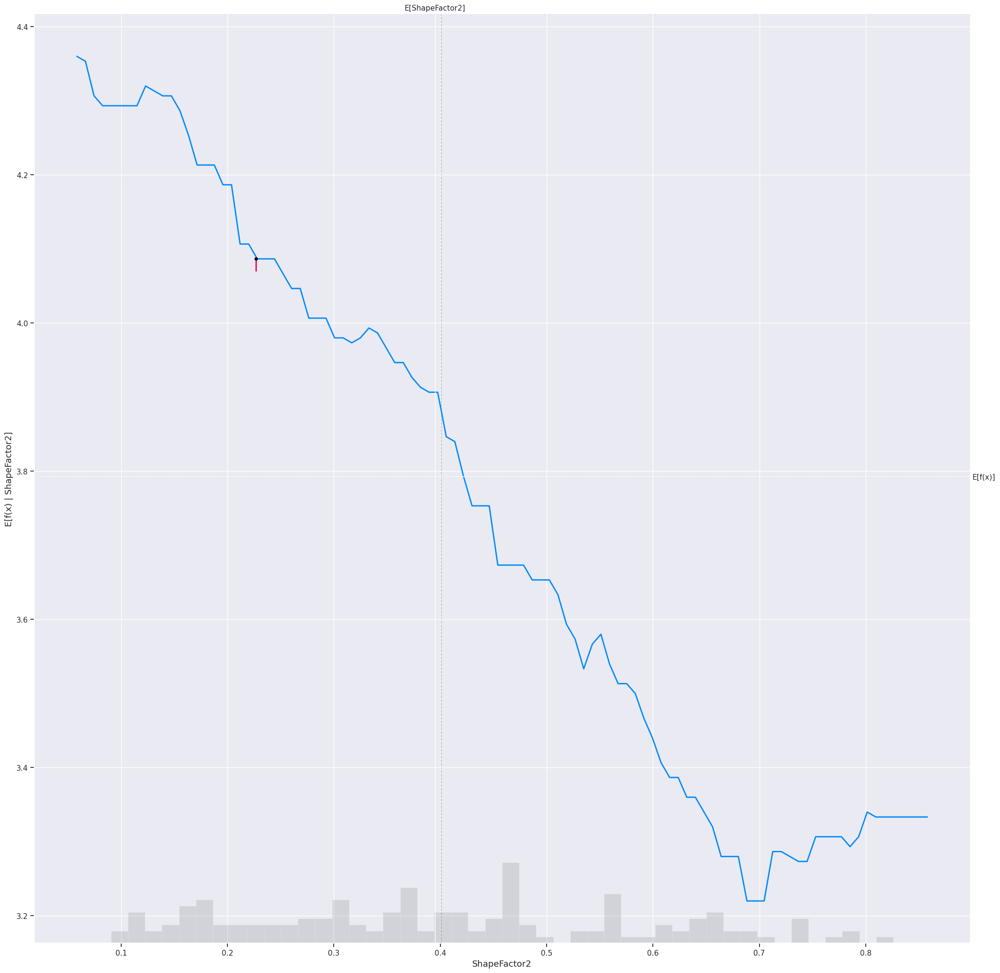

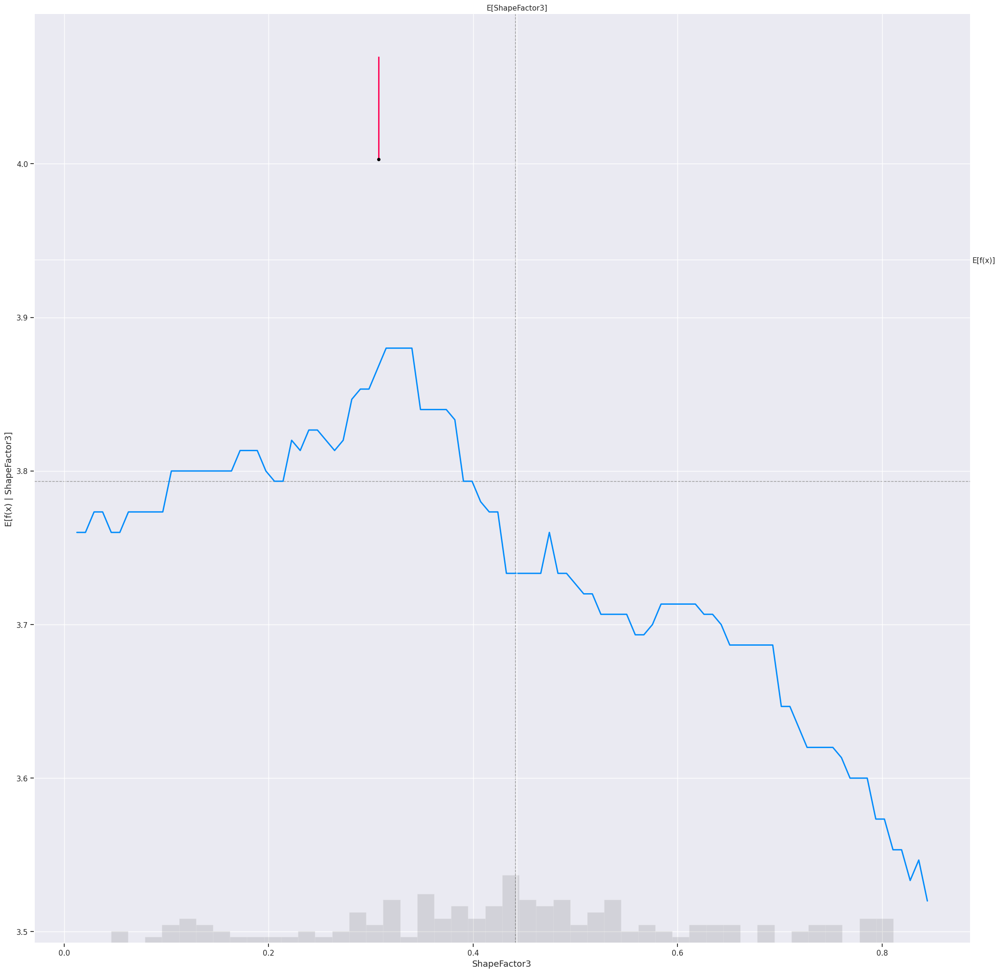

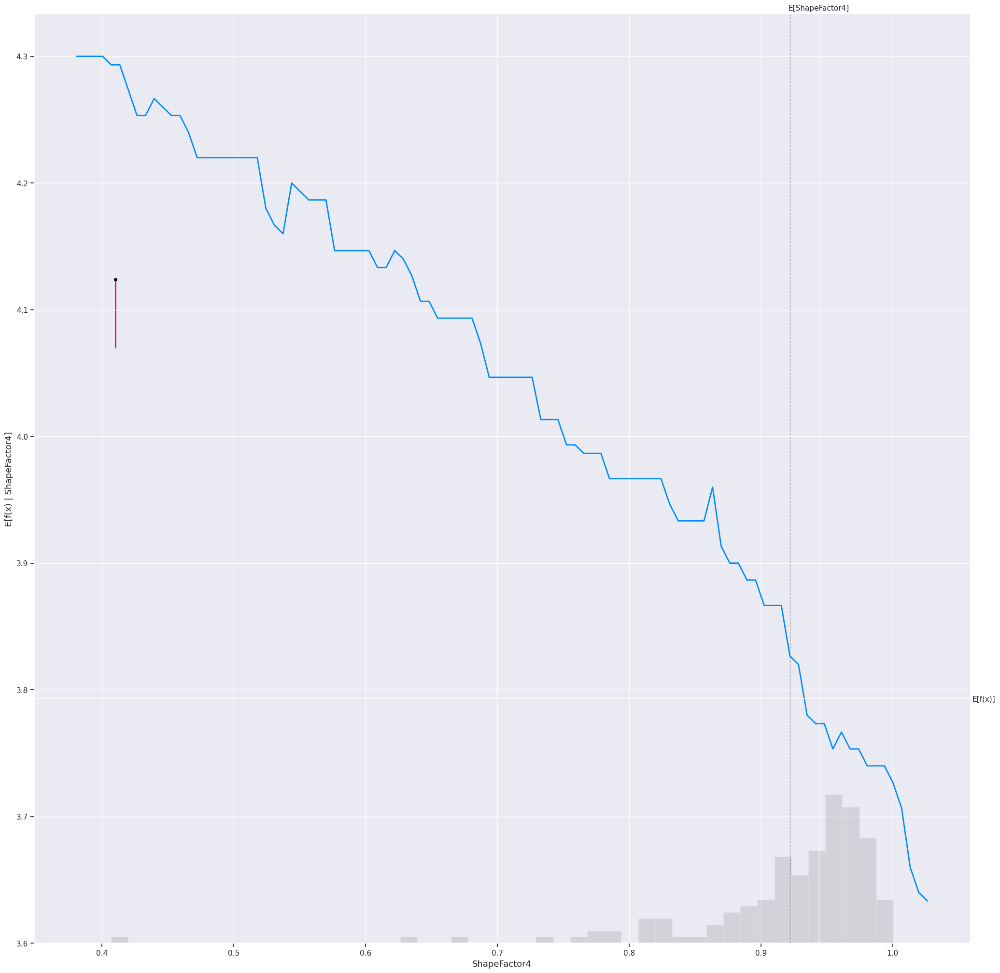

In [79]:
# SHAP explanation of a Linear Model
linear_explainer = shap.Explainer(LR.predict, X_train_shap_sample)
linear_shap_values = linear_explainer(X_train_shap_sample)


for i in X_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.plots.partial_dependence(
        i,
        LR.predict,
        X_train_shap_sample,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind:sample_ind+1, :]
    )

Permutation explainer: 151it [01:24,  1.57it/s]


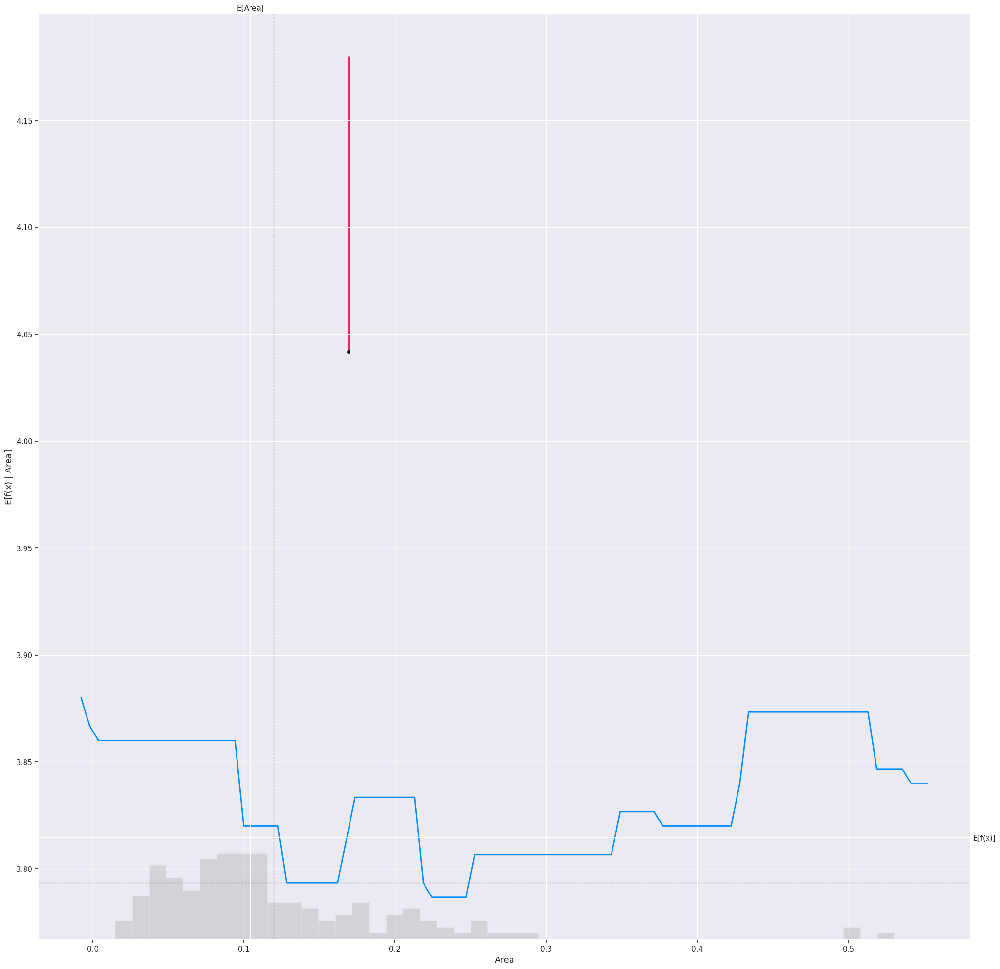

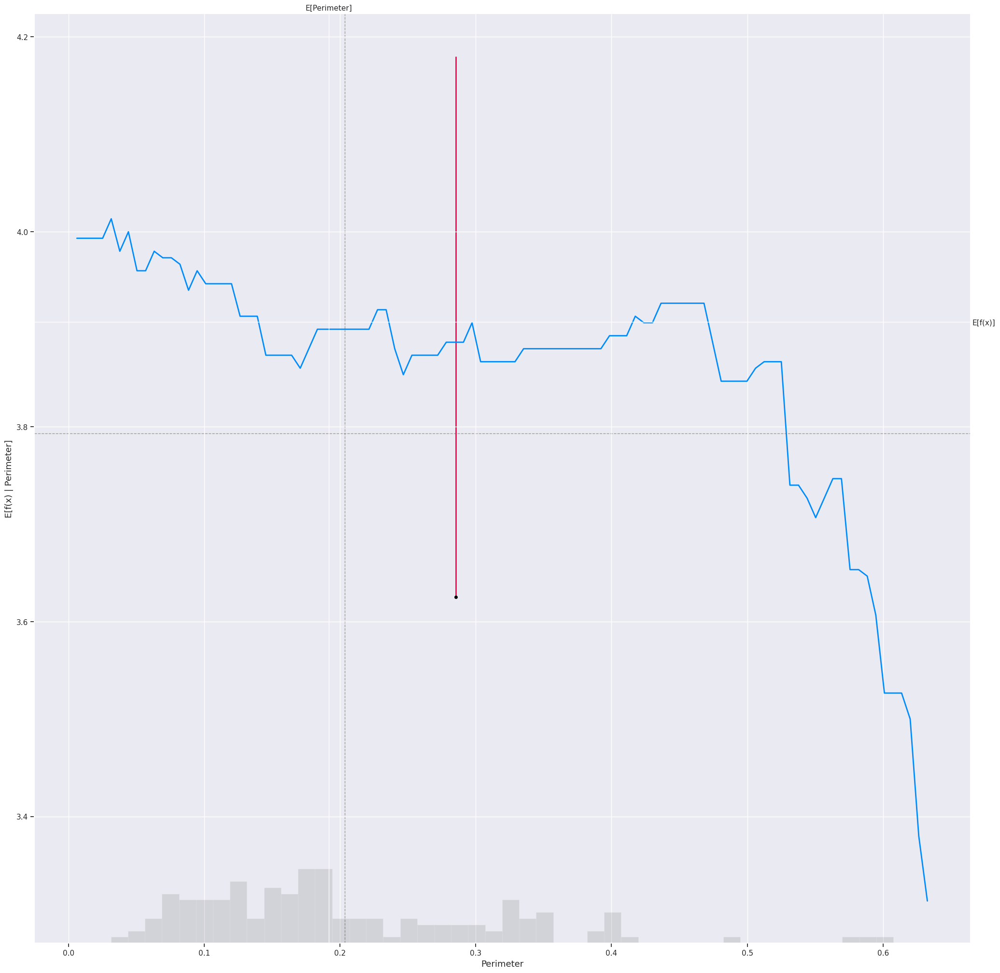

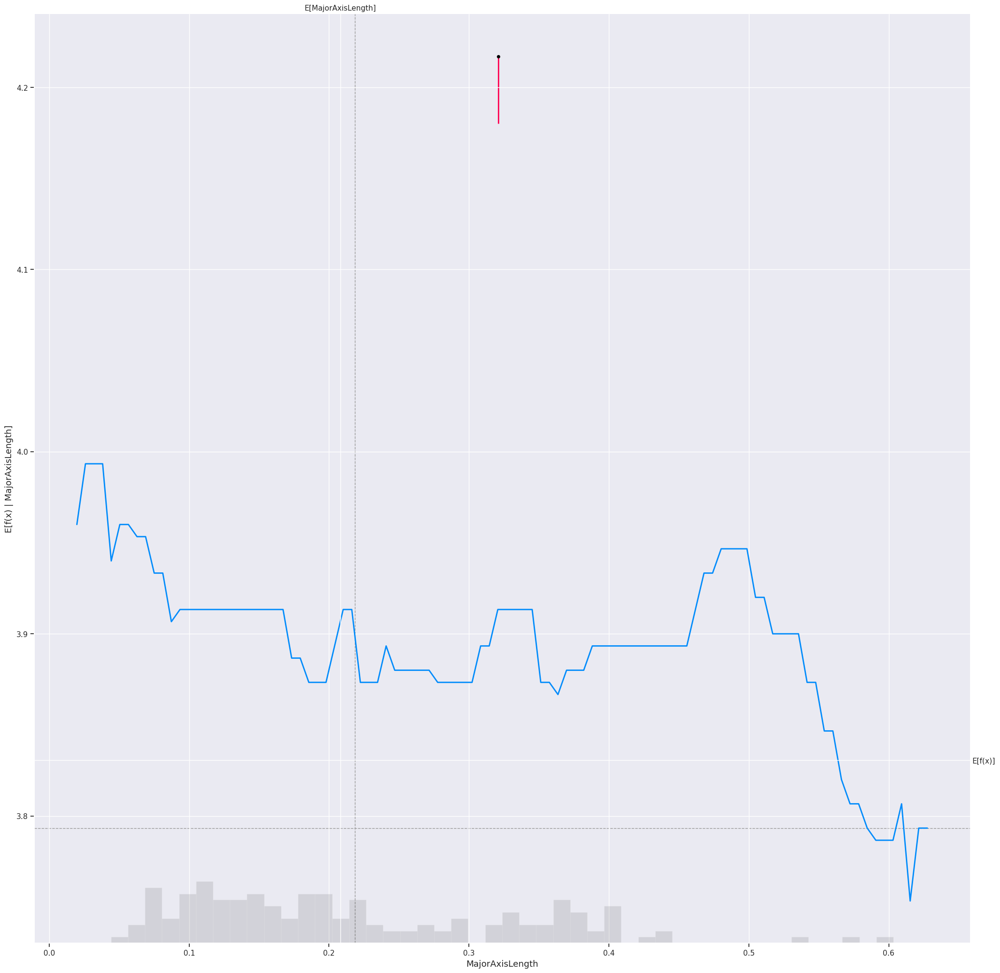

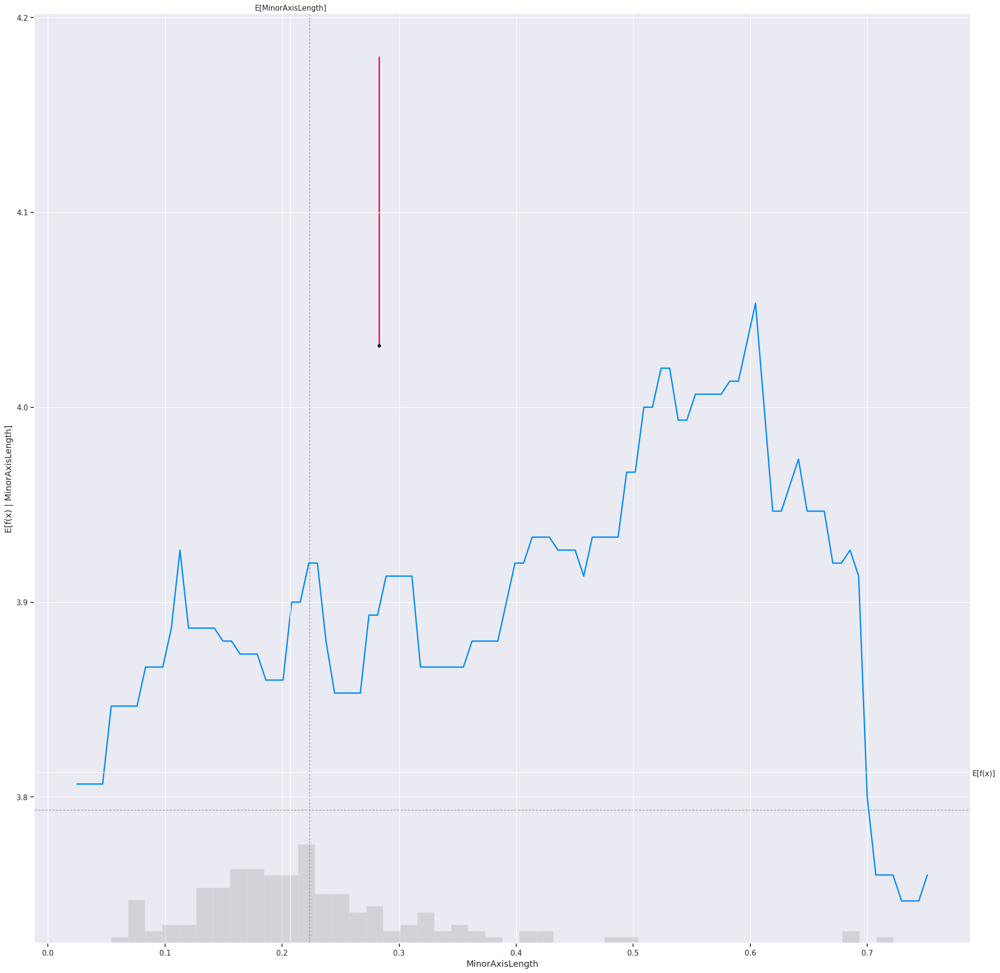

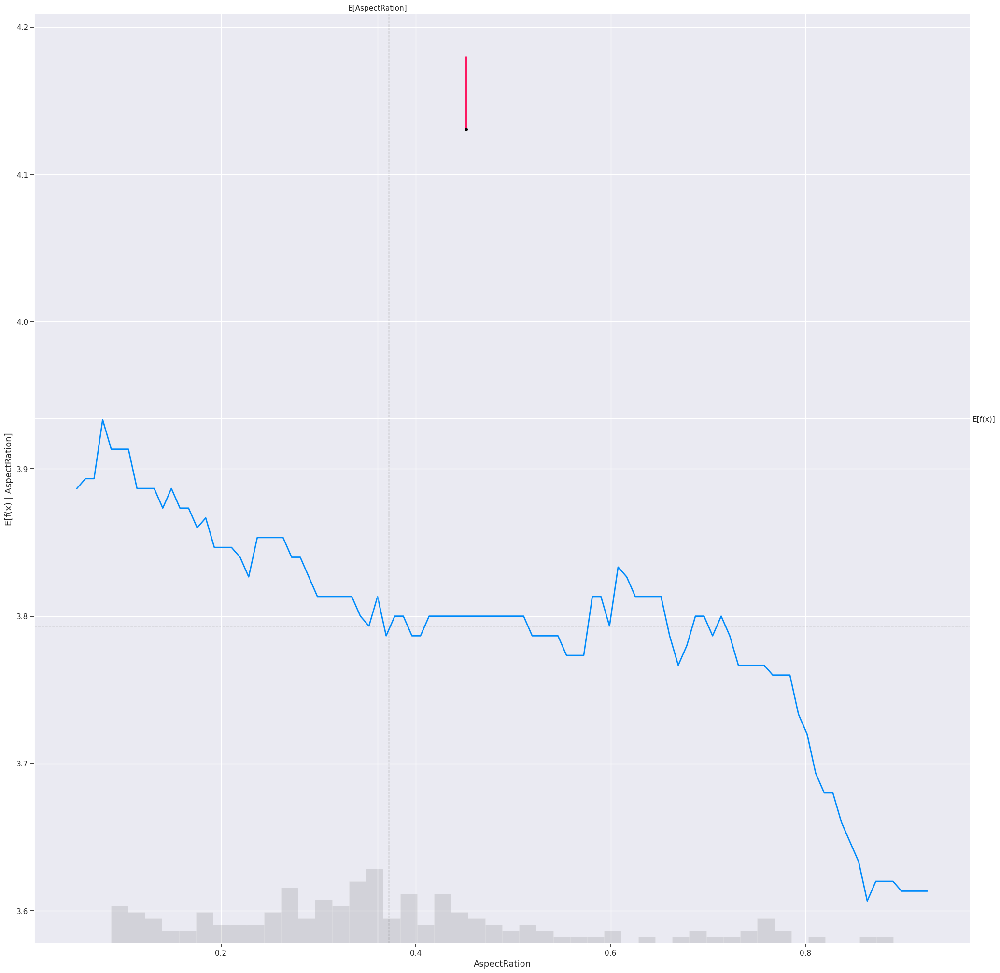

...

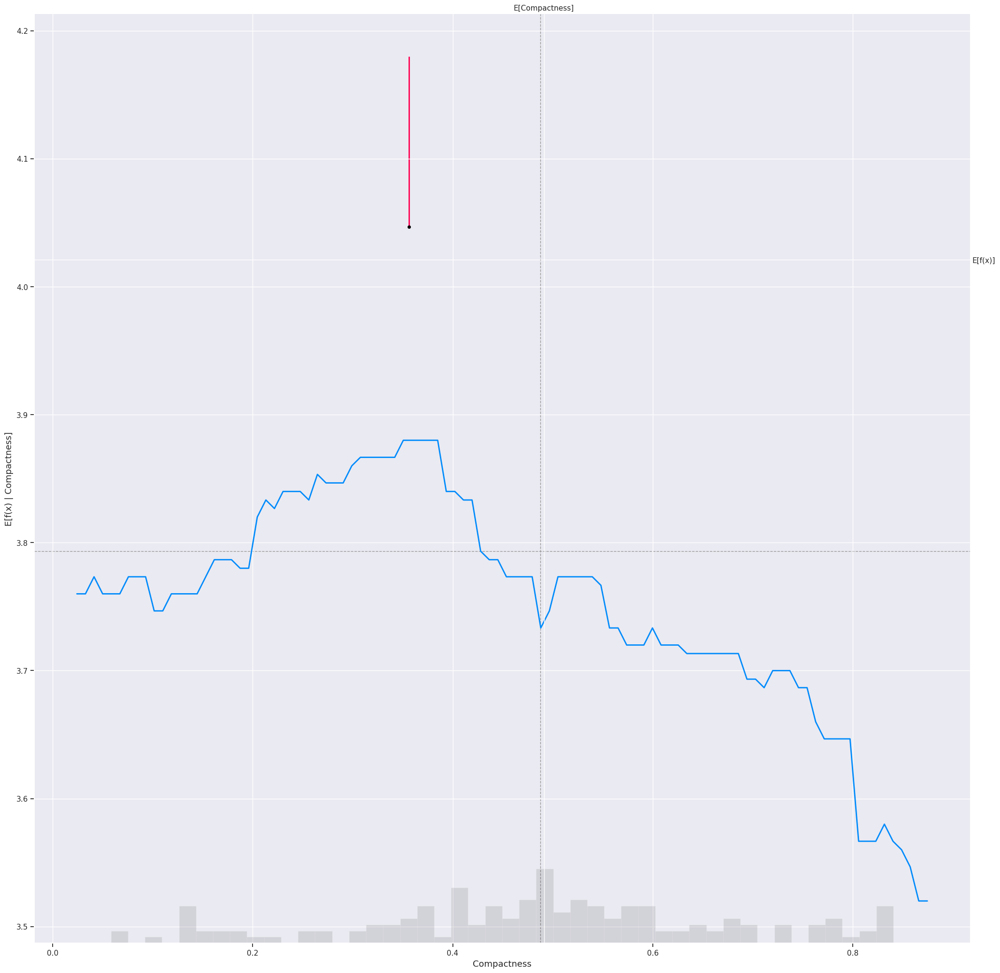

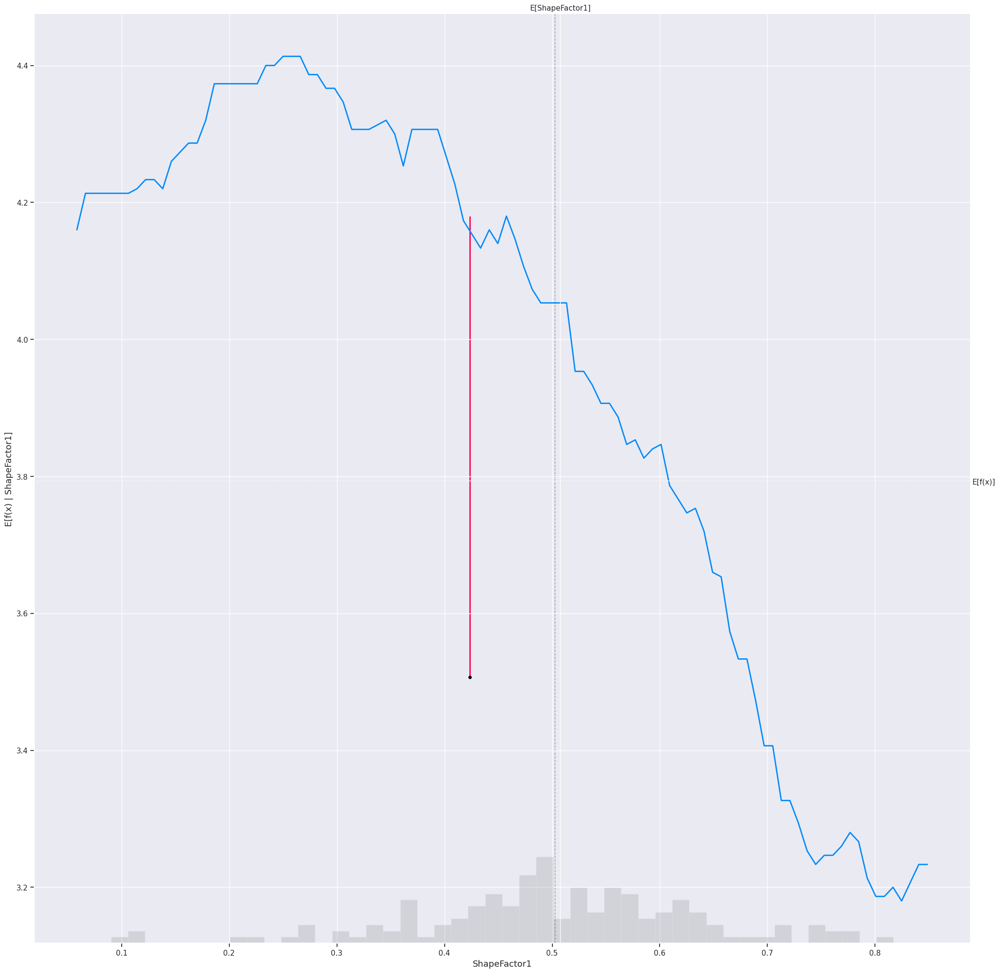

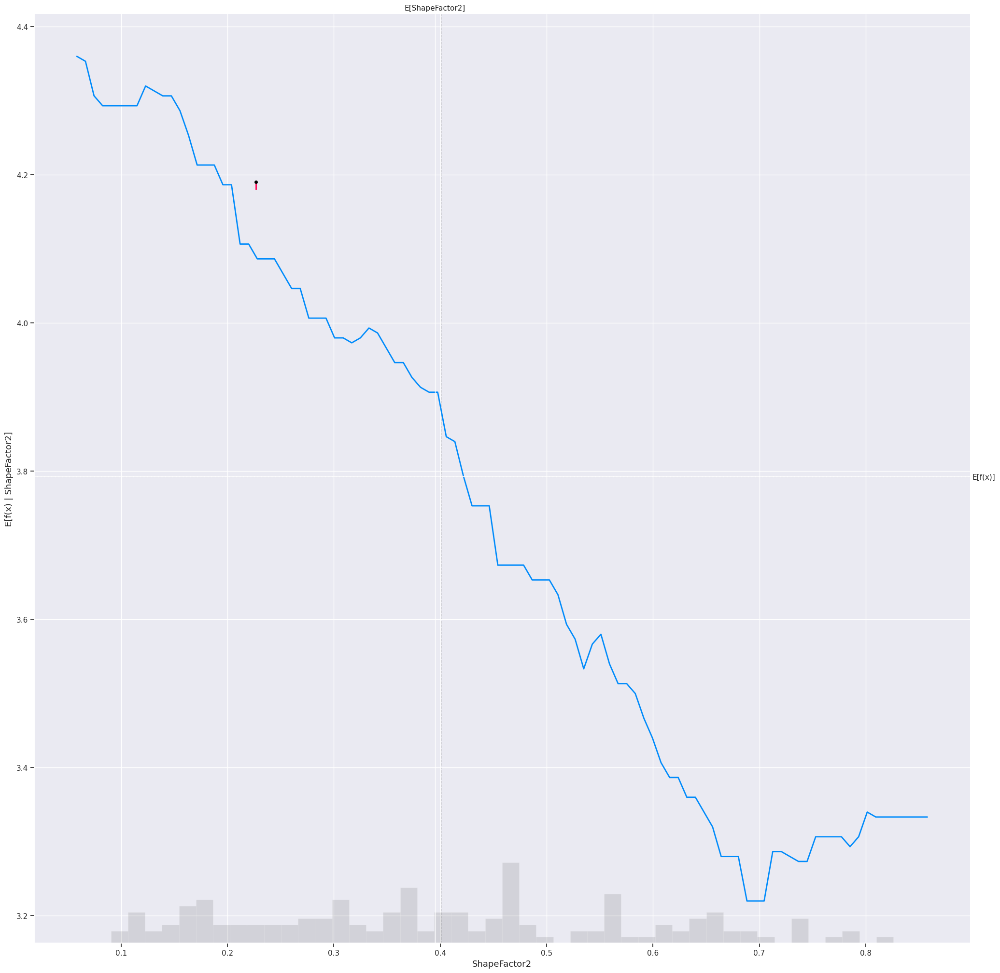

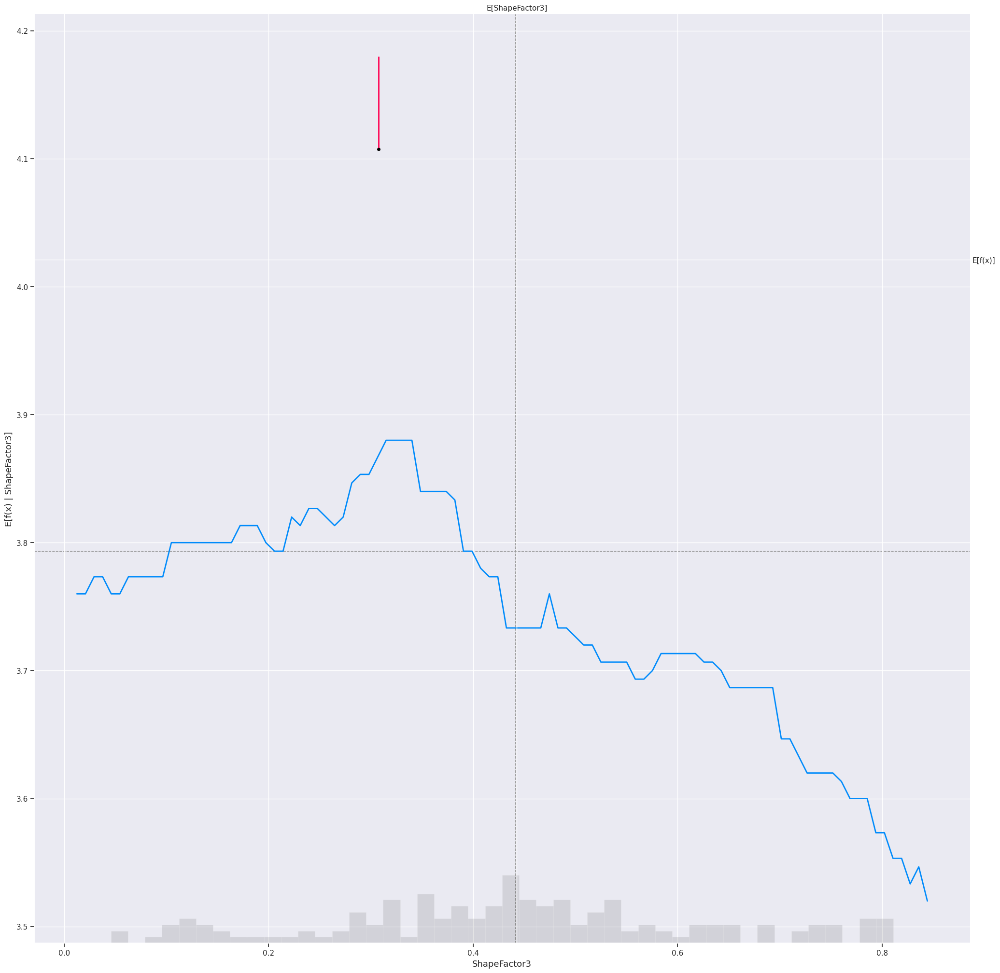

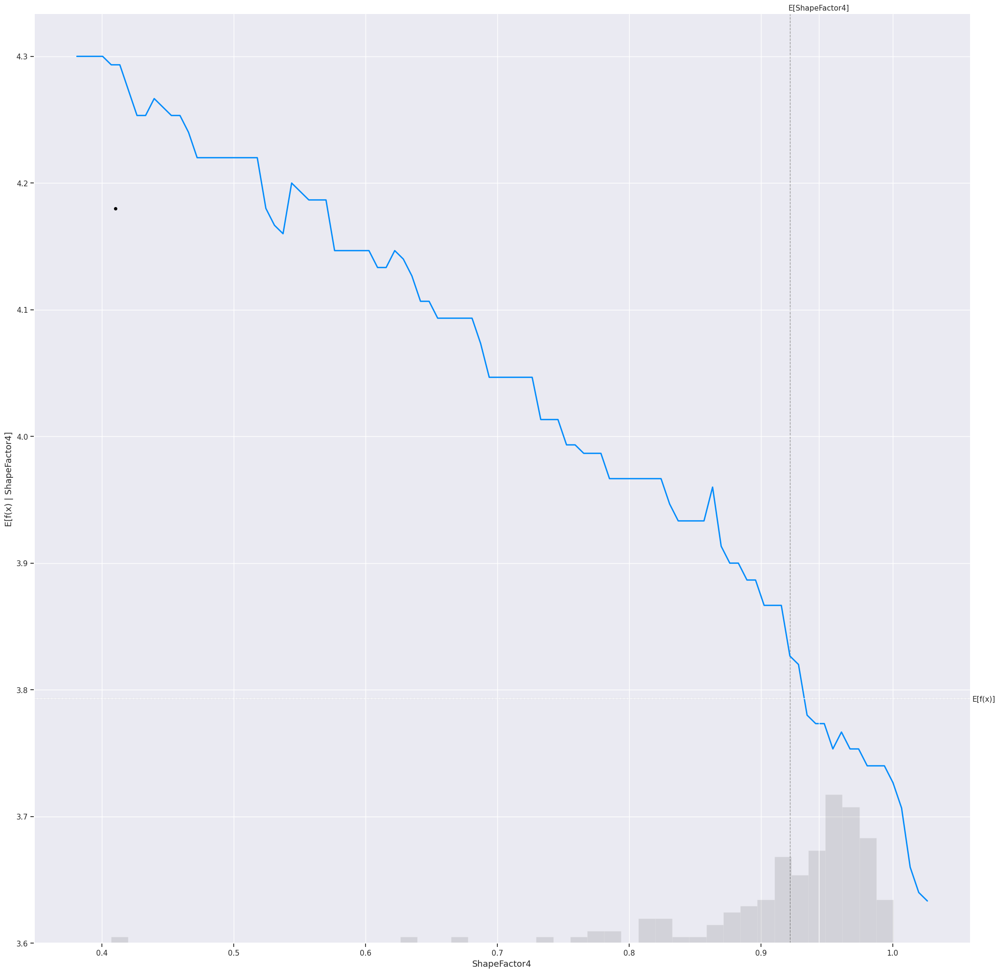

<Figure size 2500x2500 with 0 Axes>

In [81]:
# SHAP explanation of a tree based model
tree_explainer = shap.Explainer(forest.predict, X_train_shap_sample)
tree_shap_values = tree_explainer(X_train_shap_sample)


for n, i in enumerate(X_train.columns):
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        LR.predict,
        X_train_shap_sample,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
        # ax=axs[n]
    )

# Adjust the spacing between the plots and save the figure
plt.tight_layout()

### Interpreting SHAP Feature Importance Plot for Linear and Tree-based model

The idea behind SHAP feature importance is simple: Features with large absolute Shapley values are important. Since we want global importance, we average the absolute Shapley values per feature across the data. Next, we sort the features by decreasing importance and plot them.

The following plots are

SHAP feature importance for a linear model SHAP feature importance for tree-based model As we can see below in the plots, there is a difference in feature importance for both the models

For the linear model, volatile_acidity is the second most important feature but for our tree-based model sulfate is the second most important feature when we consider the average of SHAP values to calculate feature importance.

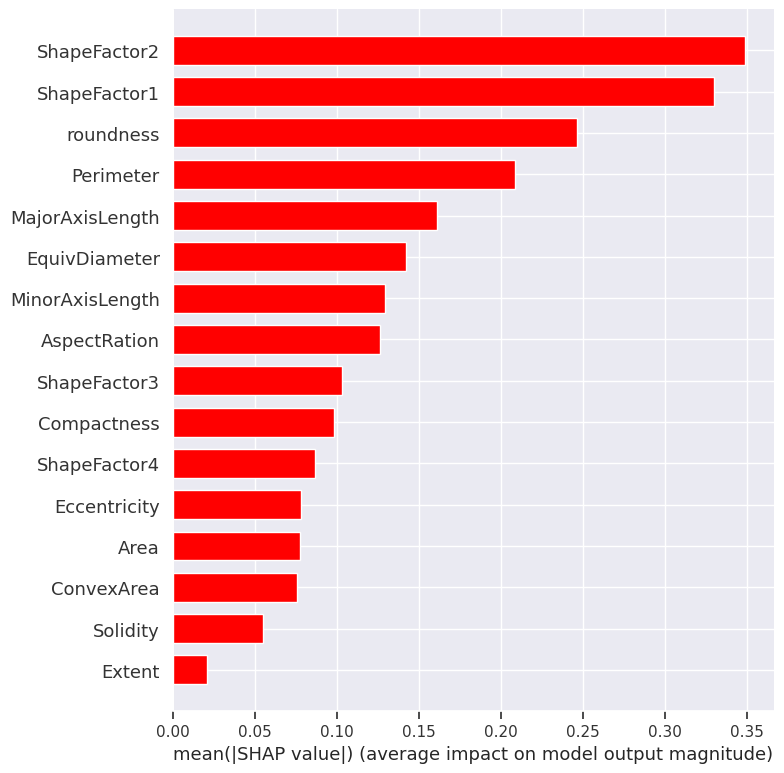

In [82]:
# SHAP variable importance for a Linear Model
shap.summary_plot(linear_shap_values, X_train, plot_type="bar", color="red")

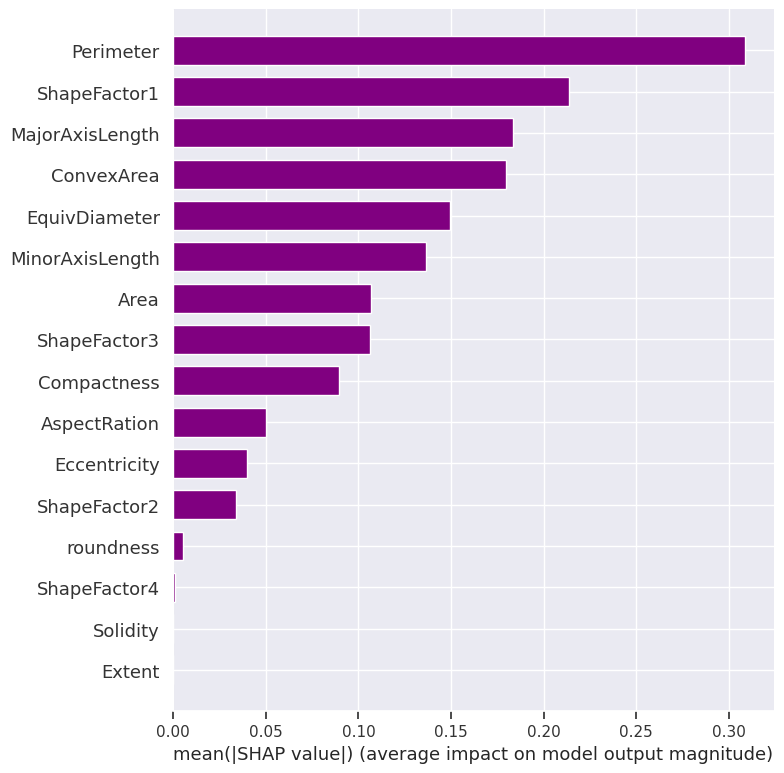

In [83]:
# SHAP variable importance for Tree based model
shap.summary_plot(tree_shap_values, X_train, plot_type="bar", color="purple")

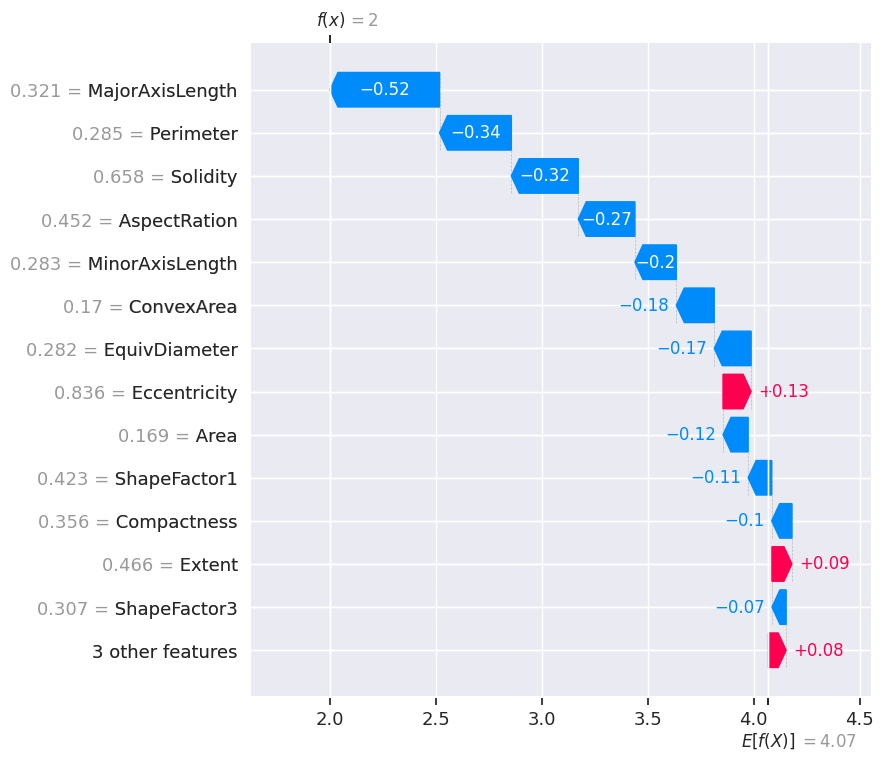

In [84]:
# Waterfall plot for linear model
shap.plots.waterfall(linear_shap_values[sample_ind], max_display=14)

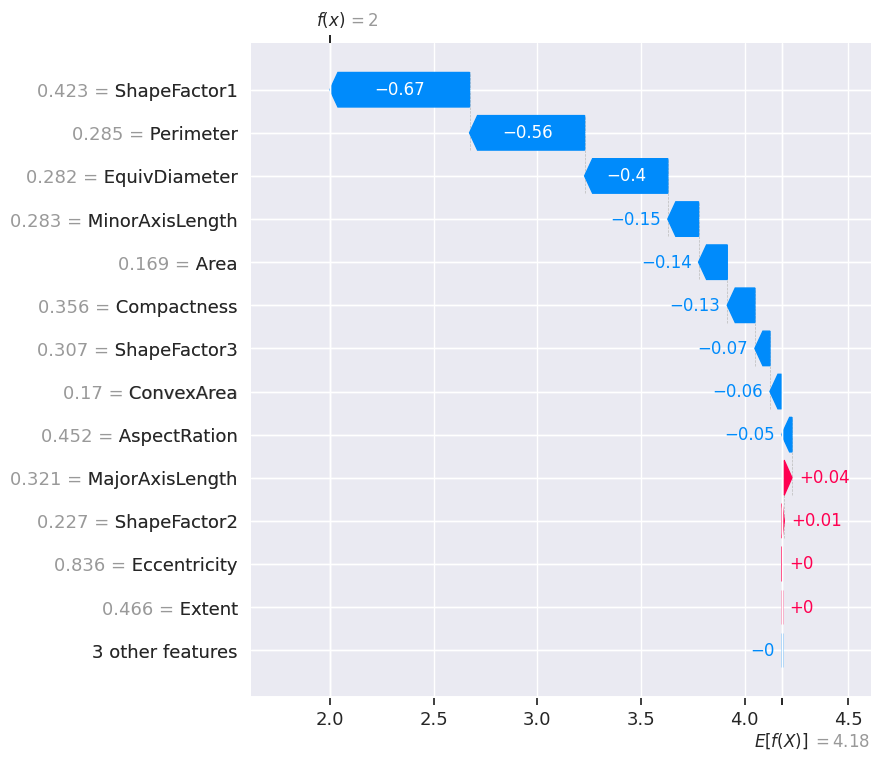

In [85]:

# Waterfall plot for Tree Based Model
shap.plots.waterfall(tree_shap_values[sample_ind], max_display=14)

### Interpret the summary plot for the Linear and Tree-based model

Here the features are listed in descending order of their importance. This is one of the easiest ways to analyze an ML model and how the features are affecting the target and to what extent.

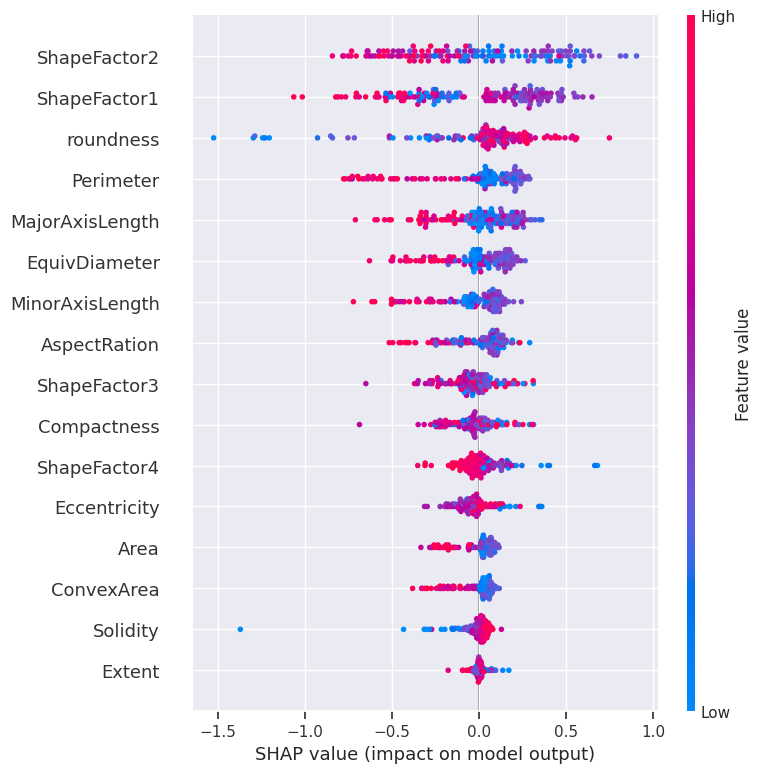

In [86]:
# SHAP summary for Linear Model
shap.summary_plot(linear_shap_values, X_train_shap_sample)

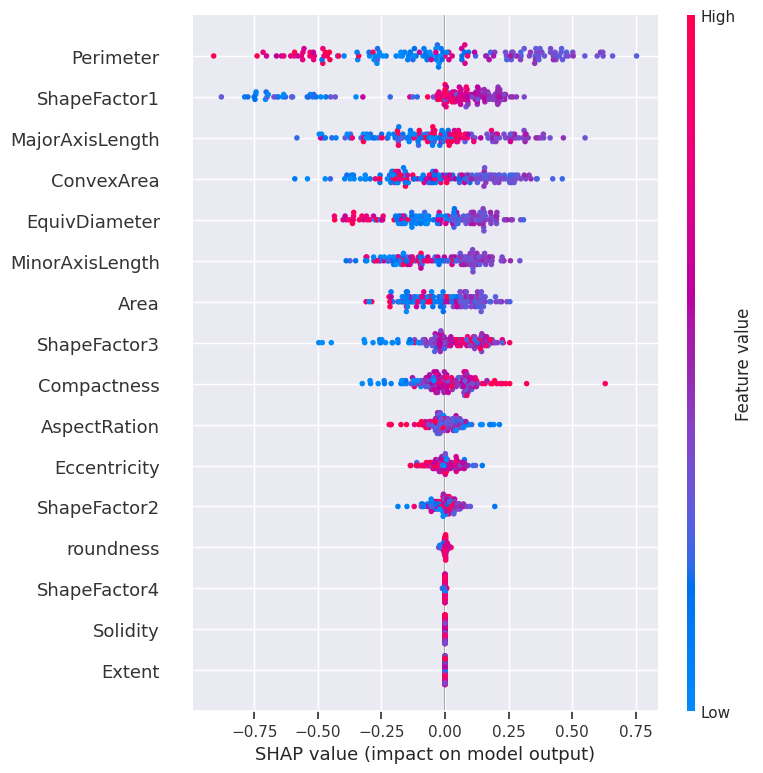

In [87]:
# SHAP summary for Tree Based Model
shap.summary_plot(tree_shap_values, X_train_shap_sample)

In [88]:
X_output_linear = X_test.copy()
X_output_linear.loc[:, "Class"] = np.round(
    LR.predict(X_output_linear), 2
)  # Attaching the output of linear model to test dataframe

X_output_tree = X_test.copy()
X_output_tree.loc[:, "Class"] = np.round(
    forest.predict(X_output_tree), 2
)  # Attaching the output of tree based model to test dataframe

In [89]:
# Force Plot of Tree Based Model
explainerModel = shap.TreeExplainer(forest)
shap_values_Model = explainerModel.shap_values(X_output_tree)


def shap_plot_tree(j):
    p = shap.force_plot(
        explainerModel.expected_value[0], shap_values_Model[0]
    )


    return p


In [90]:
shap.initjs()  # Initializing JavaScript module
print(shap_plot_tree(1))  

In [91]:
X_output_tree.iloc[[2]]

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
8394,0.096436,0.166147,0.193956,0.195016,0.371106,0.785356,0.093603,0.178265,0.685998,0.952931,0.854198,0.469317,0.520718,0.379152,0.416269,0.964849,6


**Heatmap Visualization for Linear and Tree-based model:** This visualization is a summarization of the entire dataset on how each data point in every feature is affecting the target(Class).

Here the Y-axis is Features and X-axis is Instance of that feature The color of the instance defines if it had a positive effect or negative effect by its color. If the instance is red then it had a positive effect and if the instance is blue then it had a negative effect The intensity of the color is directly proportional to the intensity of the effect. Deeper the color, the more impactful the feature is.


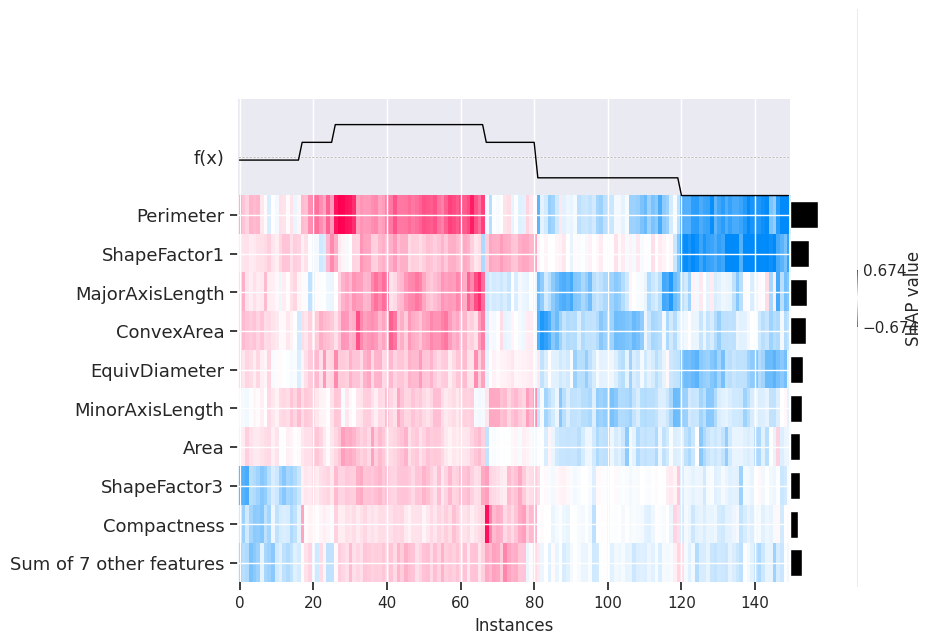

In [92]:
shap.plots.heatmap(tree_shap_values)  # SHAP HeatMap of a Tree Based Model

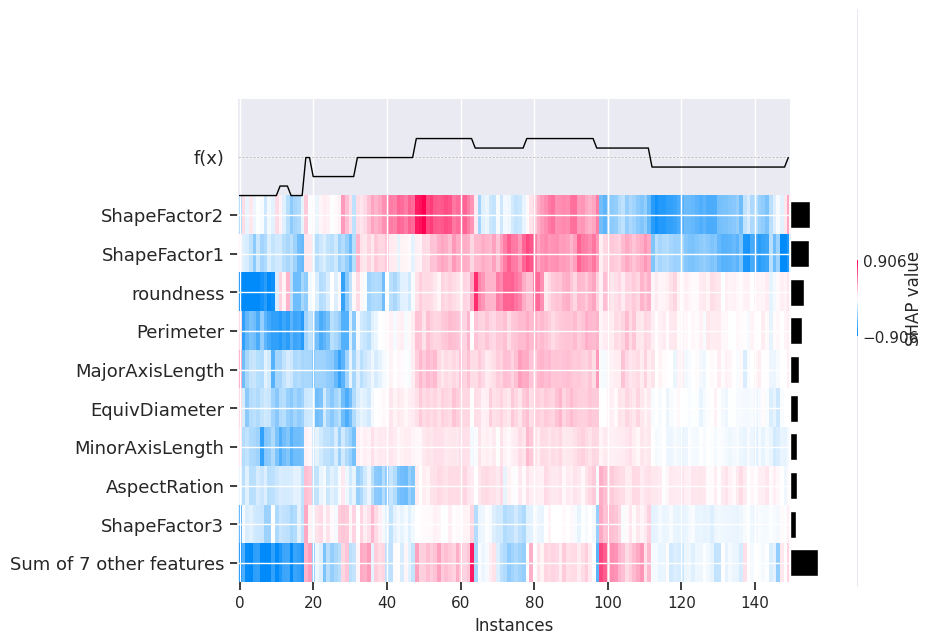

In [93]:
shap.plots.heatmap(linear_shap_values)  # SHAP heatmap for a Linear Model

### PDP

Text(0.5, 1.0, 'Partial dependence of Prediction of Dry Bean Features')

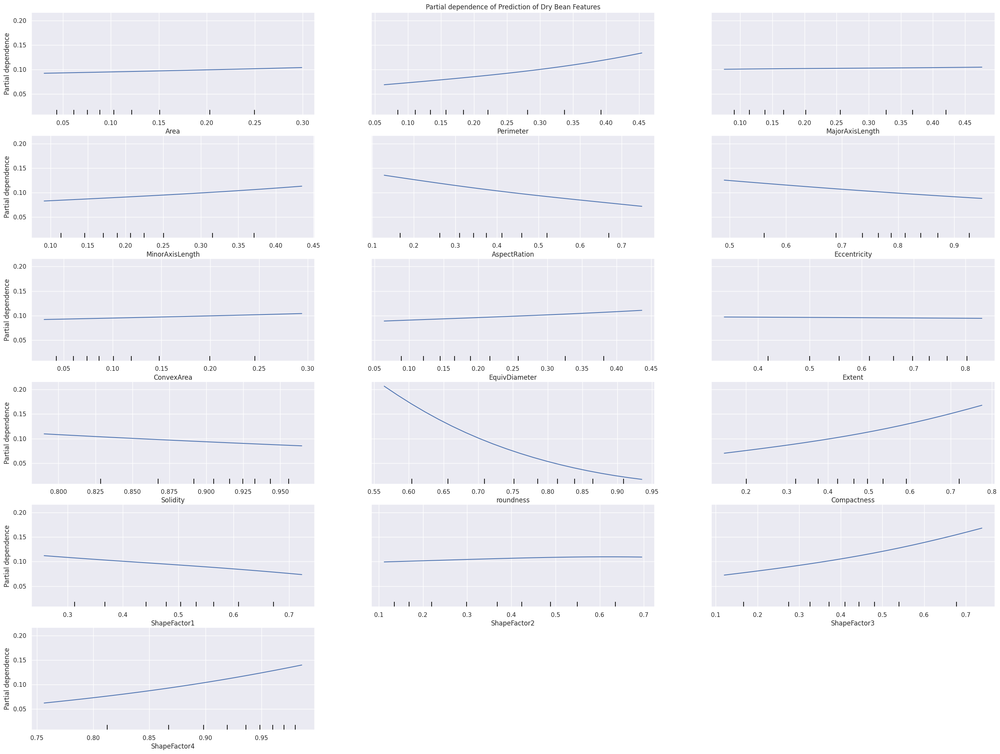

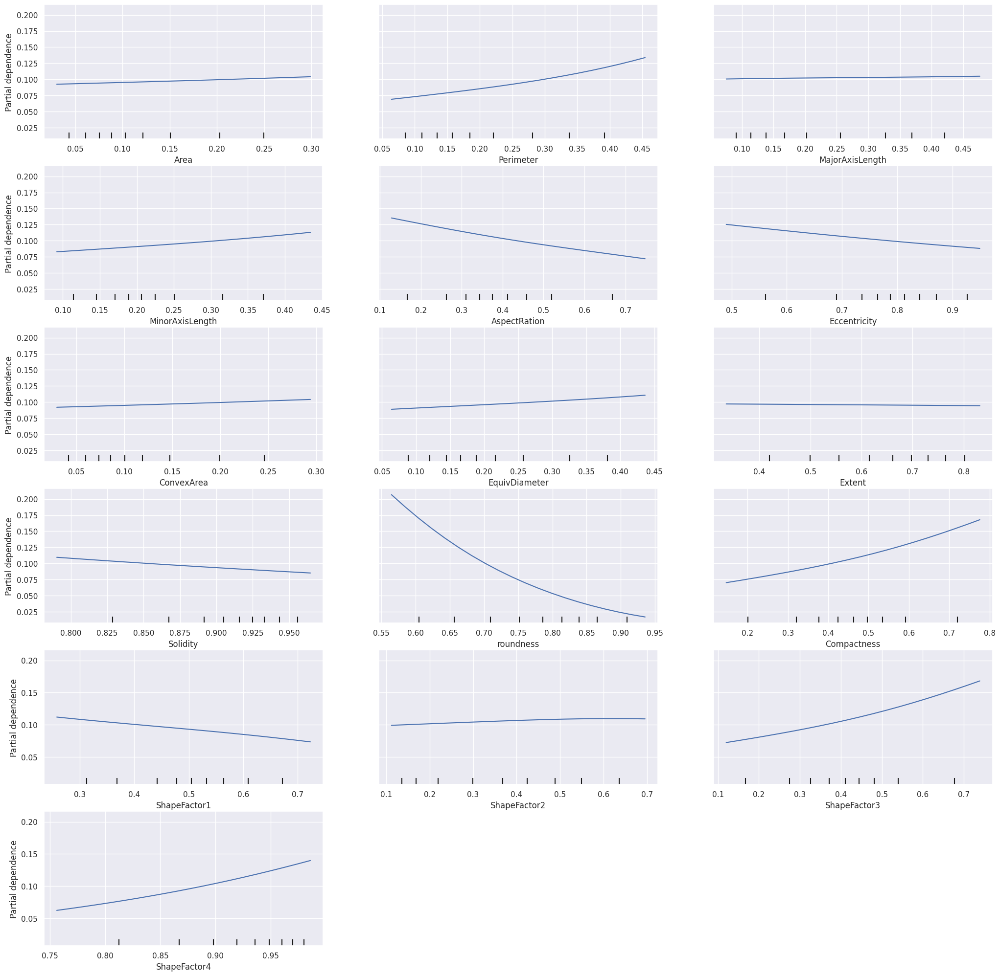

In [94]:
from sklearn.datasets import make_hastie_10_2
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import partial_dependence
import matplotlib.pyplot as plt

# PDP Plot for Linear Model
fig, ax = plt.subplots(figsize=(32, 24))
display = PartialDependenceDisplay.from_estimator(LR, X_test, X_test.columns,  n_jobs=3, grid_resolution=20,target=0)
display.plot(ax=ax)
ax.set_title("Partial dependence of Prediction of Dry Bean Features")
# plt.tight_layout()
# plt.show()

Text(0.5, 1.0, 'Partial dependence of Prediction of Dry Bean Features')

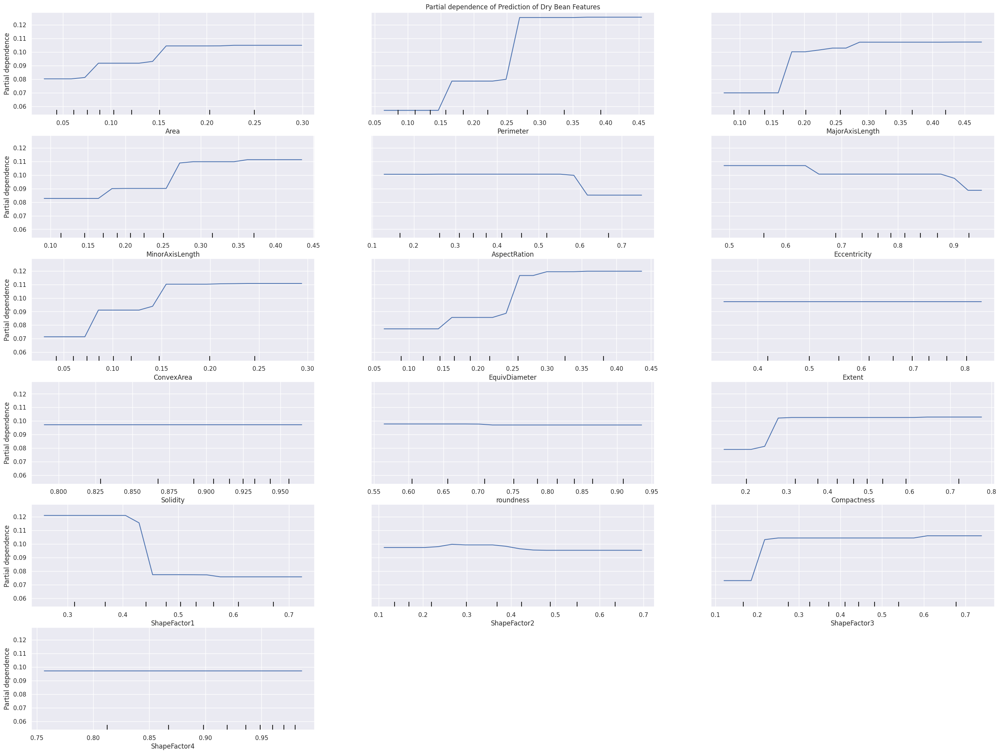

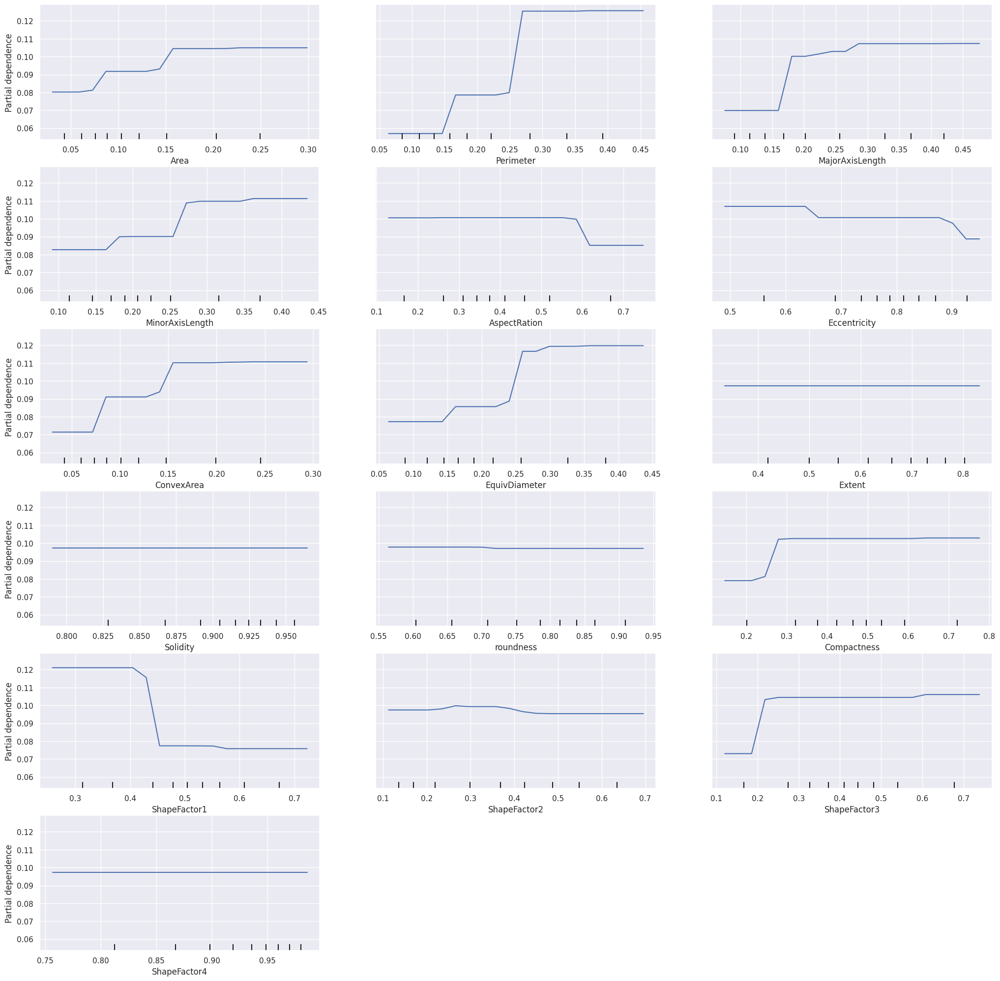

In [95]:
# PDP Plot for Tree Model
fig, ax = plt.subplots(figsize=(32, 24))
display = PartialDependenceDisplay.from_estimator(forest, X_test, X_test.columns,  n_jobs=3, grid_resolution=20,target=0)
display.plot(ax=ax)
ax.set_title("Partial dependence of Prediction of Dry Bean Features")
# plt.tight_layout()
# plt.show()

### LIME (Local Interpretation Model-Agnostic Explanation) Analysis

LIME builds a surrogate model, i.e. converts a more complicated model (say a deep tree-based model into a simple linear model) around the data points in which we are interested and then it will try to make an approximation out of this simple model on the whole model. LIME builds a local model in such a way that it can interpret the whole Black-Box

LIME works well on tabular, text, image datasets - hence it works on different datasets

Let us Interpret our Linear model and Tree-based model on sample data (sample_index = 1) using LIME and try to understand what is happening under the hood. Please refer below for Visualizations of both models

In [96]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 KB 9.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283859 sha256=599cf2eb1b146bc68e5d49cd708ccf87afba422caecc7fbefc23d770f7991cf3
  Stored in directory: /root/.cache/pip/wheels/ed/d7/c9/5a0130d06d6310bc6cbe55220e6e72dcb8c4eff9a478717066
Successfully built lime


In [97]:
import lime
from lime import lime_tabular
import numpy as np
# Initializing LIME explainer for Linear Model
lime_linear_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train), feature_names=X_train.columns, mode="regression"
)

In [98]:
# Getting LIME interpretation for a sample data
idx = 1
np_x_test = np.array(X_test)
np_y_test = np.array(y_test)
print("Prediction : ", LR.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_linear_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], LR.predict, num_features=np_x_test.shape[1]
)
lime_linear_explanation

Prediction :  [3]
Actual :      6


In [99]:
lime_linear_explanation.show_in_notebook()  # Display Results in Notebook

In [100]:
# Initializing LIME explainer for Tree Based Model
lime_tree_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train), feature_names=X_train.columns, mode="regression"
)

In [101]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(X_test)
np_y_test = np.array(y_test)
print("Prediction : ", forest.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_tree_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], forest.predict, num_features=np_x_test.shape[1]
)
lime_tree_explanation

Prediction :  [3]
Actual :      3


In [102]:
lime_tree_explanation.show_in_notebook()  # Display Results in Notebook

#### Q2. What did you do?
Answer: I performed data cleaning, AutoML, and model interpretability techniques for machine learning tasks. It covers topics such as data cleaning using Python libraries like pandas and NumPy, building machine learning models using AutoML techniques like H2O AutoML, and model interpretability using SHAP and LIME libraries.

#### Q3. How well did it work?
Answer: It worked pretty well as all the null values present in the dataset were removed. I got the accuracy of 91.7% using Logistic Regression whre we fit it in Linear Model. For AutoML we got the best model as DRF (Distributed Random Forest) which is suited for multiclass classification.

#### Q4. What did you learn?
Answer: I learned data cleaning, AutoML, and model interpretability techniques for machine learning tasks. It covers topics such as data cleaning using Python libraries like pandas and NumPy, building machine learning models using AutoML techniques like H2O AutoML, and model interpretability using SHAP and LIME libraries.

##Conclusion

At first performed data cleaning by removing missing values and outliers, scaling and transforming the data, and handling categorical variables.Then I used AutoML techniques to build machine learning models, such as using H2O AutoML for regression and classification tasks and found out the best model used. Finally, interpreted the models by analyzing the feature importance and building visualizations to gain insights.

### REFERENCES:

TowardsDataScience- https://towardsdatascience.com/explain-any-models-with-the-shap-values-use-the-kernelexplainer-79de9464897a

reference Notebook- https://github.com/ajhalthor/model-interpretability/blob/main/Shap%20Values.ipynb

https://scikit-learn.org/stable/modules/partial_dependence.html

https://archive.ics.uci.edu/ml/datasets/Dry+Bean+Dataset# https://docs.h2o.ai/h2o/latest-stable/h2o-docs/downloading.html https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html

##License
MIT License Copyright (c) 2023 Rajas Telang Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions: The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software. THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.